### Driftscan Demo
Demonstration of Driftscan measurements with DVS. Prepared by aph@sarao.ac.za.

                                                              As on 4/07/2024

In [1]:
%pylab inline
import numpy as np

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
from dvs import driftscan, cbid2url, modelsroot
from analysis.katselib import ls_archive

# Note: the flux models used for the SEFD scale are in the following file:
!cat ../catalogues/fluxmodels.csv

/home/aph/work/dvs/libraries/analysis/katsemodels.py:1156: RuntimeWarning: divide by zero encountered in divide
  I_therm = lambda p, f_MHz: p[0] * (f_MHz/p[1])**2 * (1 - np.exp(-(f_MHz/p[1])**-2)) # The radiation intensity of a nebula in thermal equilibruim... Opacity tau(f)=(f/p[1])^2 fits the data.
/home/aph/work/dvs/libraries/analysis/katsemodels.py:1156: RuntimeWarning: invalid value encountered in multiply
  I_therm = lambda p, f_MHz: p[0] * (f_MHz/p[1])**2 * (1 - np.exp(-(f_MHz/p[1])**-2)) # The radiation intensity of a nebula in thermal equilibruim... Opacity tau(f)=(f/p[1])^2 fits the data.


# ID | Name(s)                                , tag  ,   RA(J2000),  Dec(J2000), katpoint flux polynomial, katsemodel flux polynomial, linpol(frac), pol angle(deg), mean width(arcmin), shape   , Key for model       , Comments
# 
# Targets with flux models, specifically as used for DVS "single dish" tests i.e. may be resolved on long baselines.

# Taurus A: Polarisation from Vinyaikin 2007, linpol agrees with Baars 1973 at <10GHz and angle agrees with Baars 1973 at >=3GHz;Width is Perley & Butler 2017's LAS/3 to be half power width for a Gaussian
# The best data for temporal scaling [Macias-Perez et al 2010] is -0.18% at ~1 GHz (WMAP 7yr suggests 0.22% at >30 GHz)
J0534+2200 | Taurus A | 3C 144 | PKS 0531+21  , radec, 05:34:31.97, +22:00:52.1, , (2.9516 -0.2173 -0.0473 -0.0674 Y0=2017 inc=-0.0025 coeff_freq=1e9), 0.31*(30/fGHz)**-0.98, 147-122.4/fGHz**2, 2.7 , gaussian, Perley & Butler 2017,
J0534+2200 | Taurus A | 3C 144 | PKS 0531+21  , radec, 05:34:31.97, +22:00:52.1, , (2.9516 -0.21

In [3]:
# The default folder is dvs/models/receiver-models, which gets populated as part of DVS work.
# However, for receivers where we already have engineering data available, use the following:
driftscan.models.lab_Trec_dir = "/home/aph/work/katconfig/user/receiver-models/mkat"

!ls {driftscan.models.lab_Trec_dir}

RxL_SN0003_calculated_noise_H_chan.dat	RxL_SN4068_calculated_noise_H_chan.dat
RxL_SN0003_calculated_noise_V_chan.dat	RxL_SN4068_calculated_noise_V_chan.dat
RxL_SN0004_calculated_noise_H_chan.dat	RxU_SN0002_calculated_noise_H_chan.dat
RxL_SN0004_calculated_noise_V_chan.dat	RxU_SN0002_calculated_noise_V_chan.dat
RxL_SN4001_calculated_noise_H_chan.dat	RxU_SN4001_calculated_noise_H_chan.dat
RxL_SN4001_calculated_noise_V_chan.dat	RxU_SN4001_calculated_noise_V_chan.dat
RxL_SN4002_calculated_noise_H_chan.dat	RxU_SN4002_calculated_noise_H_chan.dat
RxL_SN4002_calculated_noise_V_chan.dat	RxU_SN4002_calculated_noise_V_chan.dat
RxL_SN4003_calculated_noise_H_chan.dat	RxU_SN4003_calculated_noise_H_chan.dat
RxL_SN4003_calculated_noise_V_chan.dat	RxU_SN4003_calculated_noise_V_chan.dat
RxL_SN4004_calculated_noise_H_chan.dat	RxU_SN4004_calculated_noise_H_chan.dat
RxL_SN4004_calculated_noise_V_chan.dat	RxU_SN4004_calculated_noise_V_chan.dat
RxL_SN4005_calculated_noise_H_chan.dat	RxU_SN4005_calculated_noi

In [4]:
# A folder for storing processed results
results_dir = "./l2_data"

## Drift Scans Datasets

In [5]:
recs = ls_archive("InstructionSet:*drift_scan_2* AND Antennas:*m0* AND StartTime:[2024-06-01T00:00:00Z TO *]",
                  fields=['CaptureBlockId','StartTime','CenterFrequency','Description','Targets'])
cbids = [r['CaptureBlockId'] for r in recs]

1718604536 	2024-06-17T06:09:01Z 	3061645507.81 	3: Drift scan 2 	['J0408-6545', 'PKS 0408-65', 'Drift scan_duration of J0408-
1718607657 	2024-06-17T07:01:03Z 	3061645507.81 	5: Drift scan 2 	['J0534+2200', 'Tau A', 'Taurus A', '3C 144', 'Crab', 'PKS 0
1719214722 	2024-06-24T07:38:44Z 	1283164062.5 	4: Drift scan 2 	['J0408-6545', 'PKS 0408-65', 'Drift scan_duration of J0408-
1719914846 	2024-07-02T10:07:33Z 	3061645507.81 	2: Drift scan 2 	['J0519-4546', 'Pic A', 'Pictor A', 'PKS 0518-45', 'Drift sc
1719917871 	2024-07-02T10:57:56Z 	3061645507.81 	4: Drift scan 2 	['J0408-6545', 'PKS 0408-65']
1719918308 	2024-07-02T11:05:13Z 	3061645507.81 	4: Drift scan 2 	['J0408-6545', 'PKS 0408-65', 'Drift scan_duration of J0408-


Name: 1718604536_sdp_l0 (version 4.0)
-------------------------------------------------------------------------------
URL: http://10.98.56.16/1718604536/1718604536_sdp_l0.full.rdb
Observer: Mattieu  Experiment ID: 20240617-0015
Description: '3: Drift scan 2'
Observed from 2024-06-17 08:09:01.156 SAST to 2024-06-17 08:41:25.237 SAST
Dump rate / period: 0.49998 Hz / 2.000 s
Subarrays: 1
  ID  Antennas                            Inputs  Corrprods
   0  m000,m001,m002,m003,m004,m005,m006,m007,m008,m009,m010,m011,m012,m013,m014,m015,m016,m017,m018,m019,m020,m021,m022,m023,m024,m025,m026,m027,m028,m029,m030,m031,m032,m033,m034,m035,m036,m037,m038,m039,m040,m041,m042,m043,m045,m046,m048,m049,m050,m051,m053,m054,m055,m056,m057,m058,m060,m061,m063  118      7080
Spectral Windows: 1
  ID Band Product  CentreFreq(MHz)  Bandwidth(MHz)  Channels  ChannelWidth(kHz)
   0 S    c875M1k    3062.500         875.000           1024       854.492
-------------------------------------------------------------

/home/aph/venv-py3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1577: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/aph/work_dvs/dvs/dvs/driftscan.py:271: RuntimeWarning: All-NaN slice encountered
  ax[1][p].plot(chans, 10*np.log10(np.nanmax(self.vis[:,:,p], axis=0)))


Name: 1718607657_sdp_l0 (version 4.0)
-------------------------------------------------------------------------------
URL: http://10.98.56.16/1718607657/1718607657_sdp_l0.full.rdb
Observer: Mattieu  Experiment ID: 20240617-0018
Description: '5: Drift scan 2'
Observed from 2024-06-17 09:01:03.287 SAST to 2024-06-17 09:43:27.393 SAST
Dump rate / period: 0.49998 Hz / 2.000 s
Subarrays: 1
  ID  Antennas                            Inputs  Corrprods
   0  m000,m001,m002,m003,m004,m005,m006,m007,m008,m009,m010,m011,m012,m013,m014,m015,m016,m017,m018,m019,m020,m021,m022,m023,m024,m025,m026,m027,m028,m029,m030,m031,m032,m033,m034,m035,m036,m037,m038,m039,m040,m041,m042,m043,m045,m046,m048,m049,m050,m051,m053,m054,m055,m056,m057,m058,m060,m061,m063  118      7080
Spectral Windows: 1
  ID Band Product  CentreFreq(MHz)  Bandwidth(MHz)  Channels  ChannelWidth(kHz)
   0 S    c875M1k    3062.500         875.000           1024       854.492
-------------------------------------------------------------

/home/aph/venv-py3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1577: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/aph/work_dvs/dvs/dvs/driftscan.py:271: RuntimeWarning: All-NaN slice encountered
  ax[1][p].plot(chans, 10*np.log10(np.nanmax(self.vis[:,:,p], axis=0)))


Name: 1719214722_sdp_l0 (version 4.0)
-------------------------------------------------------------------------------
URL: http://10.98.56.16/1719214722/1719214722_sdp_l0.full.rdb
Observer: Mattieu  Experiment ID: 20240624-0006
Description: '4: Drift scan 2'
Observed from 2024-06-24 09:38:44.728 SAST to 2024-06-24 10:31:32.329 SAST
Dump rate / period: 0.99981 Hz / 1.000 s
Subarrays: 1
  ID  Antennas                            Inputs  Corrprods
   0  m000,m001,m002,m003,m004,m005,m006,m007,m008,m009,m010,m011,m012,m013,m014,m015,m016,m017,m018,m019,m020,m021,m022,m023,m024,m025,m026,m027,m028,m029,m030,m031,m032,m033,m034,m035,m036,m037,m038,m039,m040,m041,m043,m044,m045,m046,m047,m048,m049,m050,m051,m052,m053,m054,m055,m056,m057,m058,m059,m060,m062,m063  124      7812
Spectral Windows: 1
  ID Band Product  CentreFreq(MHz)  Bandwidth(MHz)  Channels  ChannelWidth(kHz)
   0 L    c856M1k    1284.000         856.000           1024       835.938
----------------------------------------------

/home/aph/venv-py3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1577: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/aph/work_dvs/dvs/dvs/driftscan.py:271: RuntimeWarning: All-NaN slice encountered
  ax[1][p].plot(chans, 10*np.log10(np.nanmax(self.vis[:,:,p], axis=0)))


Name: 1719914846_sdp_l0 (version 4.0)
-------------------------------------------------------------------------------
URL: http://10.98.56.16/1719914846/1719914846_sdp_l0.full.rdb
Observer: Mattieu  Experiment ID: 20240702-0004
Description: '2: Drift scan 2'
Observed from 2024-07-02 12:07:33.697 SAST to 2024-07-02 12:49:57.804 SAST
Dump rate / period: 0.49998 Hz / 2.000 s
Subarrays: 1
  ID  Antennas                            Inputs  Corrprods
   0  m000,m001,m002,m003,m004,m005,m006,m007,m008,m009,m010,m011,m012,m013,m014,m015,m016,m017,m018,m019,m020,m021,m022,m023,m025,m026,m028,m029,m030,m031,m032,m033,m034,m035,m036,m037,m038,m039,m040,m041,m042,m043,m045,m046,m048,m049,m050,m051,m052,m053,m054,m055,m056,m057,m058,m060,m061,m062,m063  118      7080
Spectral Windows: 1
  ID Band Product  CentreFreq(MHz)  Bandwidth(MHz)  Channels  ChannelWidth(kHz)
   0 S    c875M1k    3062.500         875.000           1024       854.492
-------------------------------------------------------------

/home/aph/venv-py3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1577: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/aph/work_dvs/dvs/dvs/driftscan.py:271: RuntimeWarning: All-NaN slice encountered
  ax[1][p].plot(chans, 10*np.log10(np.nanmax(self.vis[:,:,p], axis=0)))


Name: 1719917871_sdp_l0 (version 4.0)
-------------------------------------------------------------------------------
URL: http://10.98.56.16/1719917871/1719917871_sdp_l0.full.rdb
Observer: Mattieu  Experiment ID: 20240702-0006
Description: '4: Drift scan 2'
Observed from 2024-07-02 12:57:56.324 SAST to 2024-07-02 12:58:52.326 SAST
Dump rate / period: 0.49998 Hz / 2.000 s
Subarrays: 1
  ID  Antennas                            Inputs  Corrprods
   0  m000,m001,m002,m003,m004,m005,m006,m007,m008,m009,m010,m011,m012,m013,m014,m015,m016,m017,m018,m019,m020,m021,m022,m023,m025,m026,m028,m029,m030,m031,m032,m033,m034,m035,m036,m037,m038,m039,m040,m041,m042,m043,m045,m046,m048,m049,m050,m051,m052,m053,m054,m055,m056,m057,m058,m060,m061,m062,m063  118      7080
Spectral Windows: 1
  ID Band Product  CentreFreq(MHz)  Bandwidth(MHz)  Channels  ChannelWidth(kHz)
   0 S    c875M1k    3062.500         875.000           1024       854.492
-------------------------------------------------------------

/home/aph/venv-py3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1577: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/aph/work_dvs/dvs/dvs/driftscan.py:271: RuntimeWarning: All-NaN slice encountered
  ax[1][p].plot(chans, 10*np.log10(np.nanmax(self.vis[:,:,p], axis=0)))


Name: 1719918308_sdp_l0 (version 4.0)
-------------------------------------------------------------------------------
URL: http://10.98.56.16/1719918308/1719918308_sdp_l0.full.rdb
Observer: Mattieu  Experiment ID: 20240702-0007
Description: '4: Drift scan 2'
Observed from 2024-07-02 13:05:13.342 SAST to 2024-07-02 13:30:53.407 SAST
Dump rate / period: 0.49998 Hz / 2.000 s
Subarrays: 1
  ID  Antennas                            Inputs  Corrprods
   0  m000,m001,m002,m003,m004,m005,m006,m007,m008,m009,m010,m011,m012,m013,m014,m015,m016,m017,m018,m019,m020,m021,m022,m023,m025,m026,m028,m029,m030,m031,m032,m033,m034,m035,m036,m037,m038,m039,m040,m041,m042,m043,m045,m046,m048,m049,m050,m051,m052,m053,m054,m055,m056,m057,m058,m060,m061,m062,m063  118      7080
Spectral Windows: 1
  ID Band Product  CentreFreq(MHz)  Bandwidth(MHz)  Channels  ChannelWidth(kHz)
   0 S    c875M1k    3062.500         875.000           1024       854.492
-------------------------------------------------------------

/home/aph/venv-py3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1577: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/aph/work_dvs/dvs/dvs/driftscan.py:271: RuntimeWarning: All-NaN slice encountered
  ax[1][p].plot(chans, 10*np.log10(np.nanmax(self.vis[:,:,p], axis=0)))


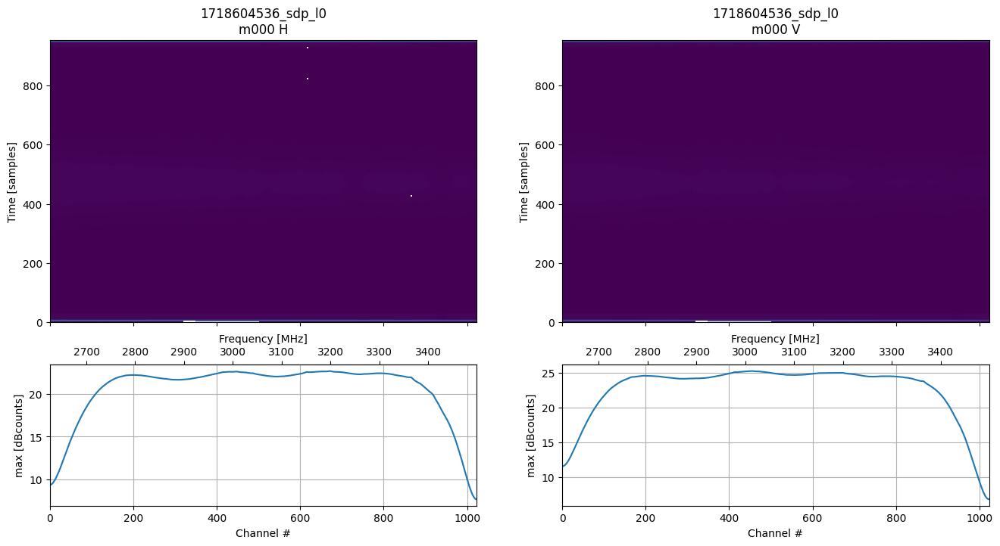

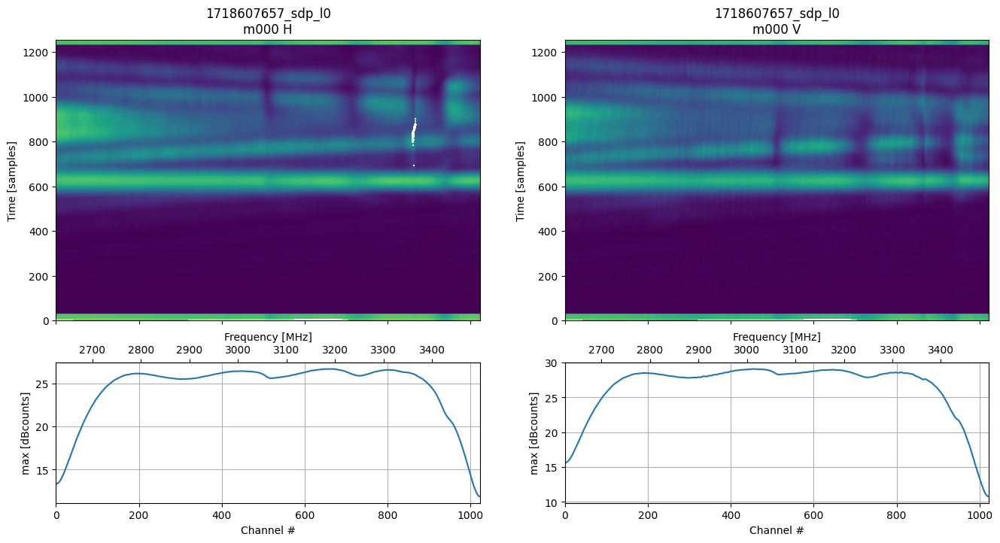

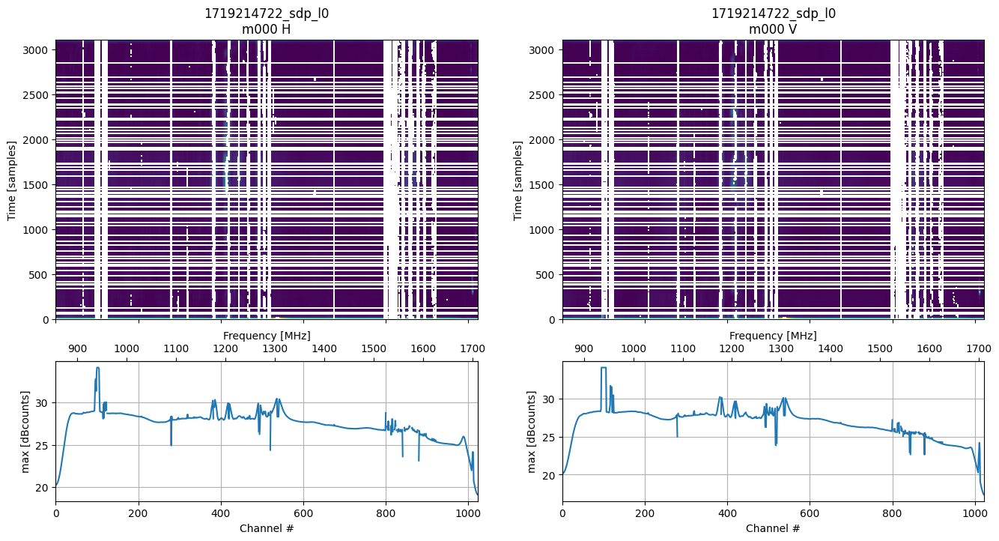

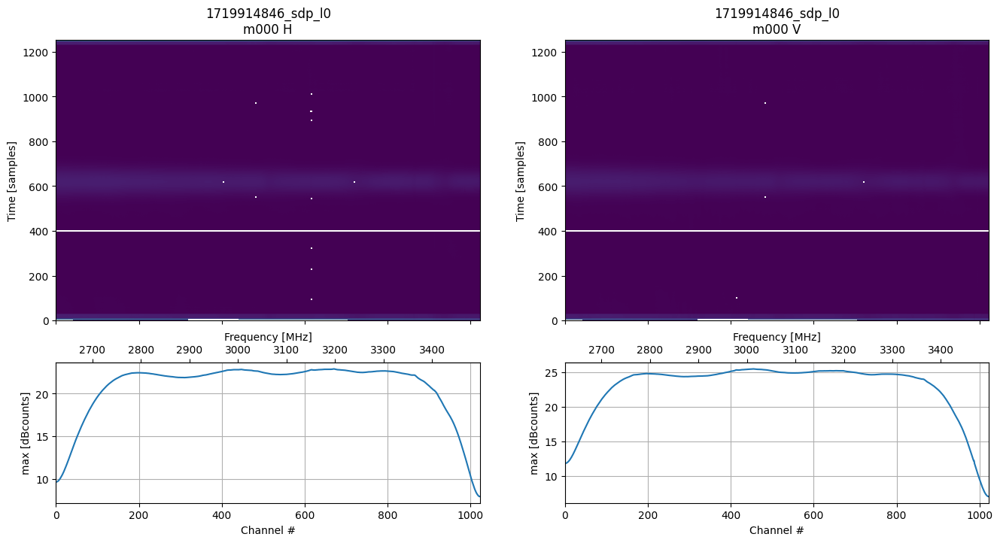

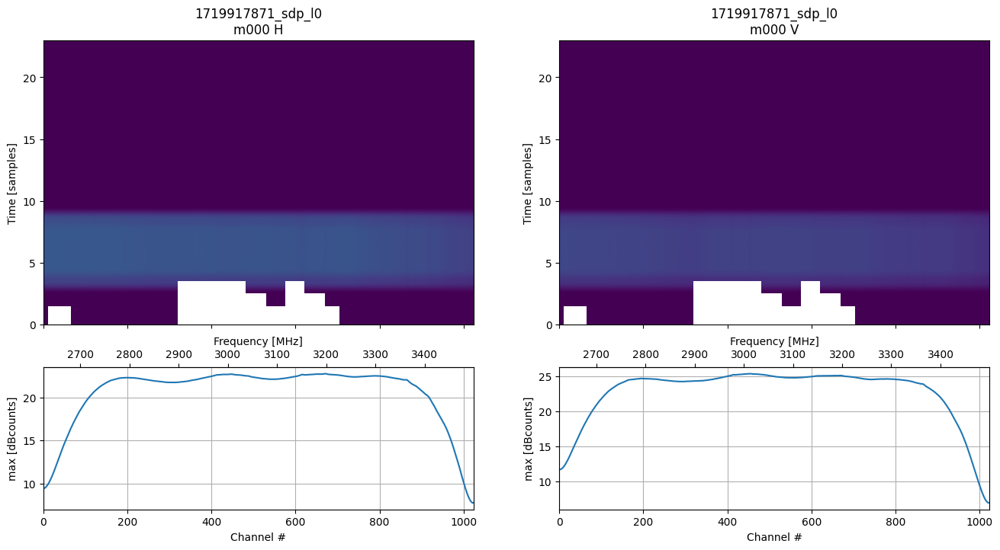

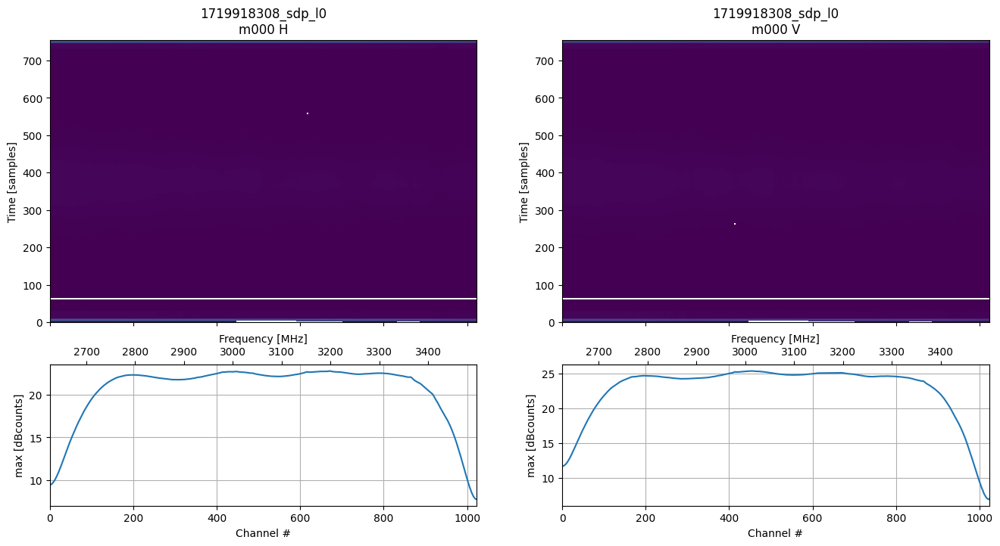

In [6]:
# Generates an overview figure per dataset
for cbid in cbids:
    ds = driftscan.DriftDataset(cbid2url(cbid), ant=0, debug=True)

# 1718604536, PKS0408-65, S4 band. Low SNR, but works.
# 1718607657, Taurus A, S4 band. 8 degrees from Sun - too close to fit reliable background!
# 1719214722, PKS0408-65, L band. Low SNR and LOTS of data lost - even with flagging not worth using.
# 1719914846, Pictor A, S4 band. Good
# 1719917871, ABORTED
# 1719918308, PKS0408-65, S4 band. Low SNR, but works.

## First example - Typical use
Demonstrated on a single antenna.

Processing drift scan 1718604536_sdp_l0 on m000 with receiver s.66.

Source:	 J0408-6545
INFO: defaulting to the first of the following flux models: PKSCAT90,Kuhr 1981,SARAO
	 Gaussian-shaped extent 0.0 arcmin; flux model as per [PKSCAT90].
INFO: Fitting transit & beam widths from the data itself.


/home/aph/venv-py3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


INFO: Fitting channel 0 of 67
INFO: Fitting channel 10 of 67
INFO: Fitting channel 20 of 67
INFO: Fitting channel 30 of 67
INFO: Fitting channel 40 of 67
INFO: Fitting channel 50 of 67
INFO: Fitting channel 60 of 67
Fitting HPBW over 2625 - 3499 MHz assuming D=13.50 m
Simultaneous fit to 2 products: 1.33181 lambda^1 / 13.5
Simultaneous fit to 2 products: 1.75396 lambda^(1.11923) / 13.5
Transit found at relative time sample 469; averaging 2 time samples at each datum.
UTC for bore sight transit of target: 2024-06-17 06:25:04.196
    Antenna pointing to RA 4.139 hrs, DEC -65.753 deg
    Target Az,El: [157.5372477   47.97366754] deg
    Antenna Az,El: [157.55158578  47.98470217] deg
    Source within [0.01433808 0.01103463] deg of beam bore sight (<0.028 HPBW)
    Distance from target to the Sun 91 deg
    Distance from target to the Moon 98 deg
Scaling source flux for pointing offset, by 0.999 - 0.998 over frequency range

Now determining measured and predicted SEFD with target in beam n

/home/aph/work_dvs/dvs/dvs/driftscan.py:76: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.plot(x_axis,vis,style,**plotargs)


Report generated <bruce.science.kat.ac.za:/home/aph/work/dvs/notebooks/1718604536_sdp_l0_m000_driftscan.pdf>


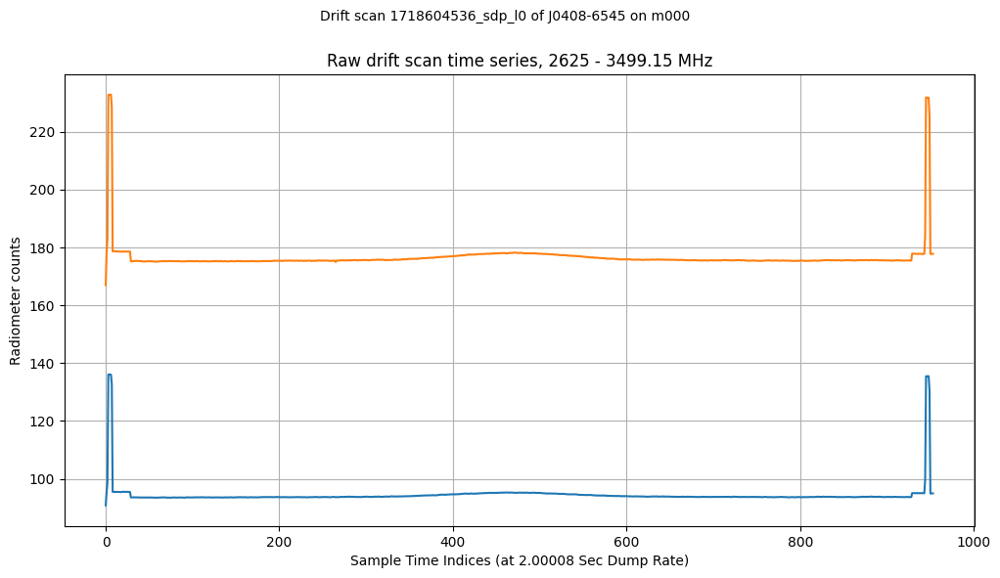

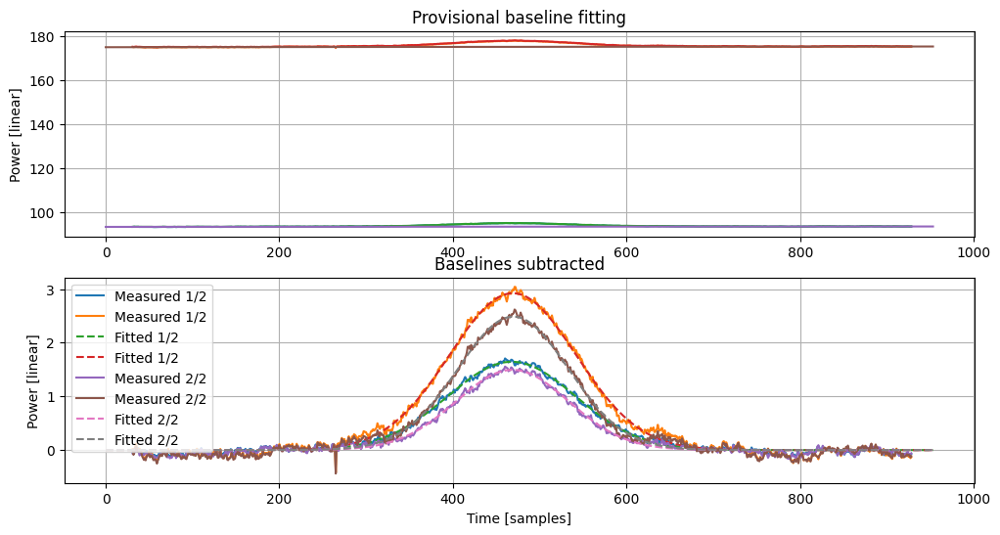

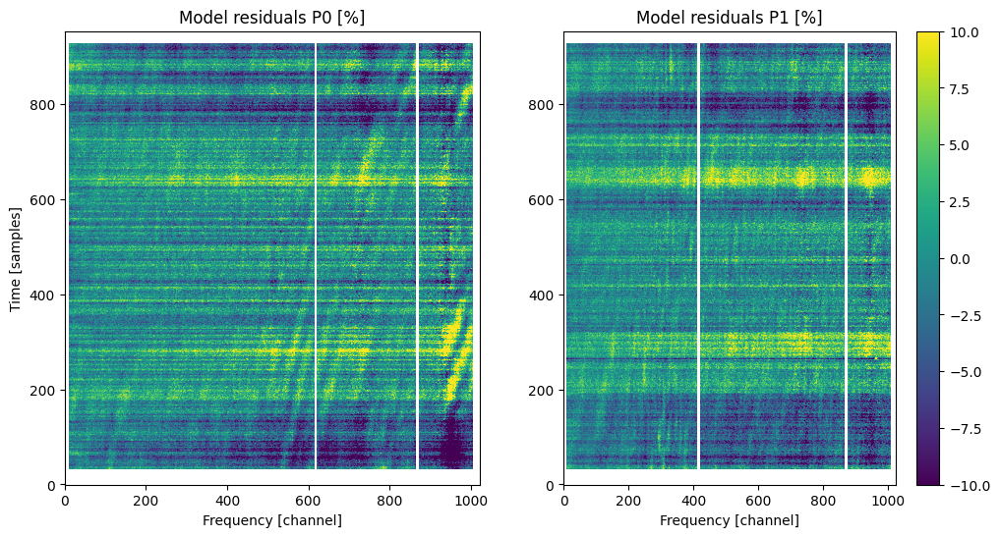

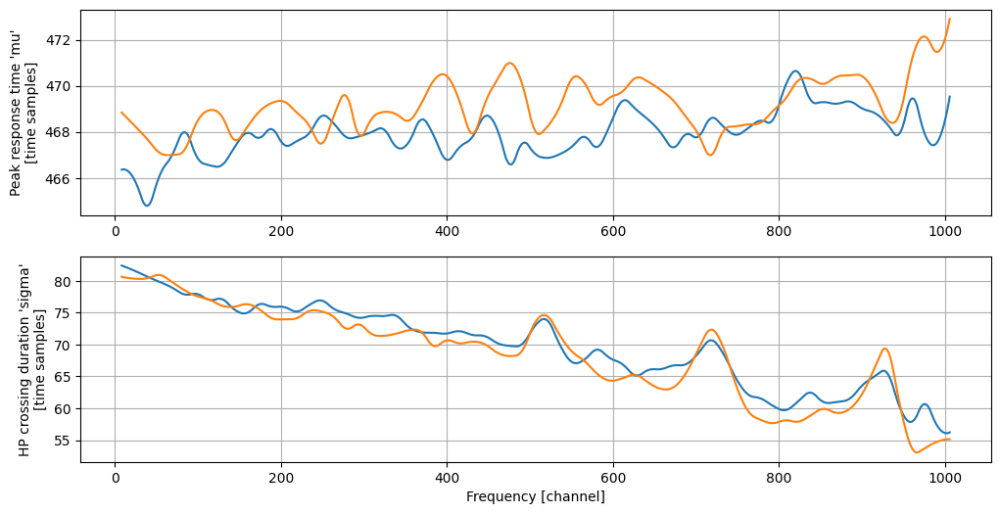

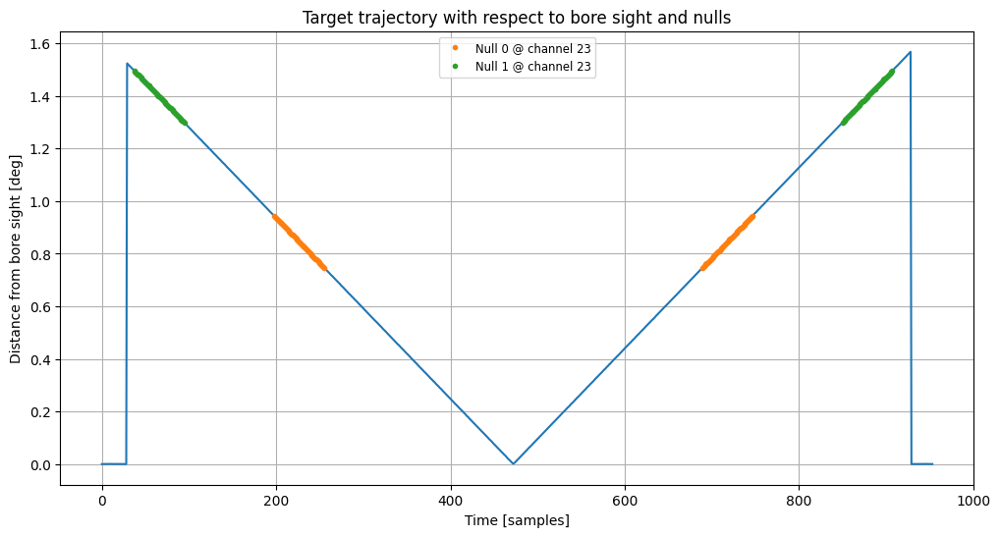

...

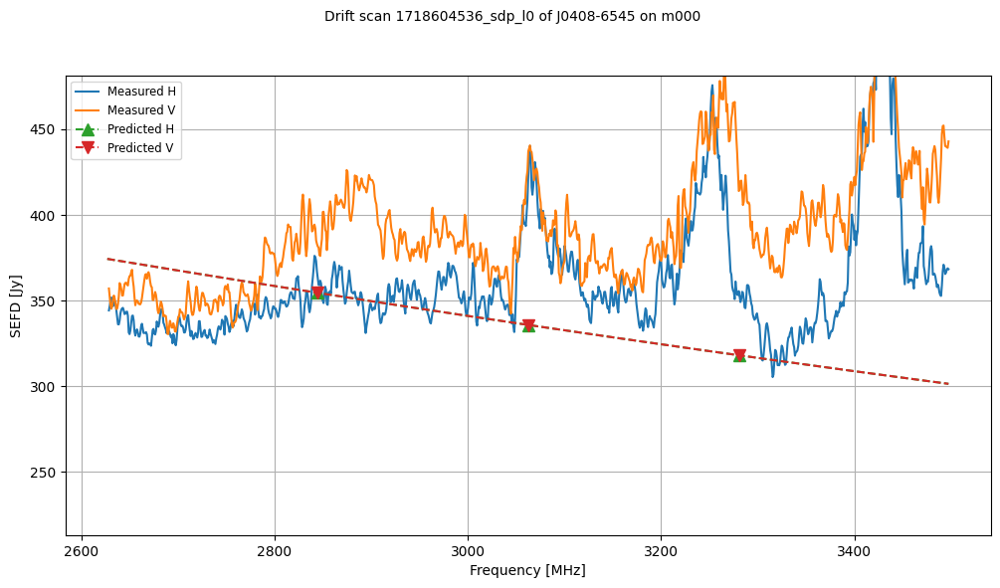

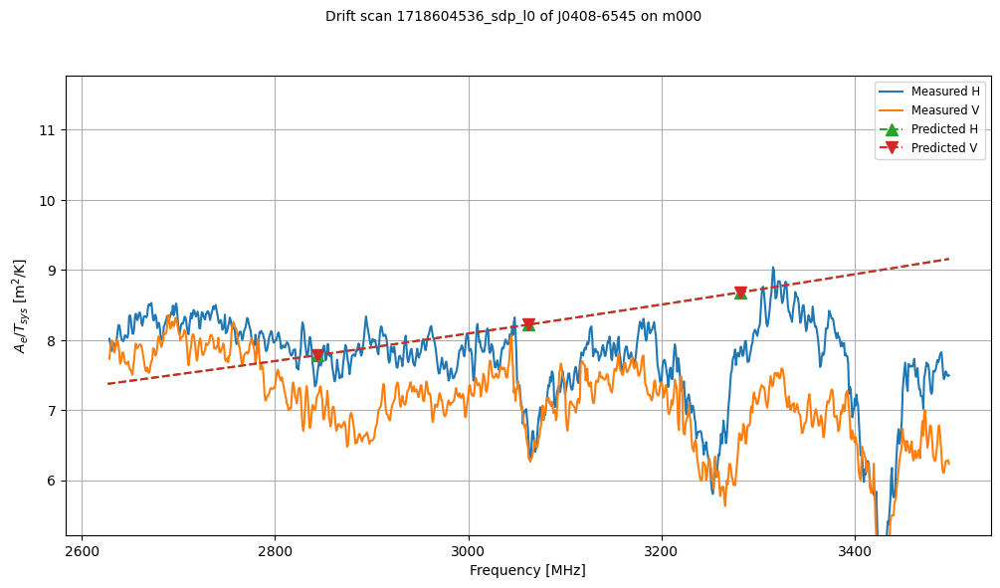

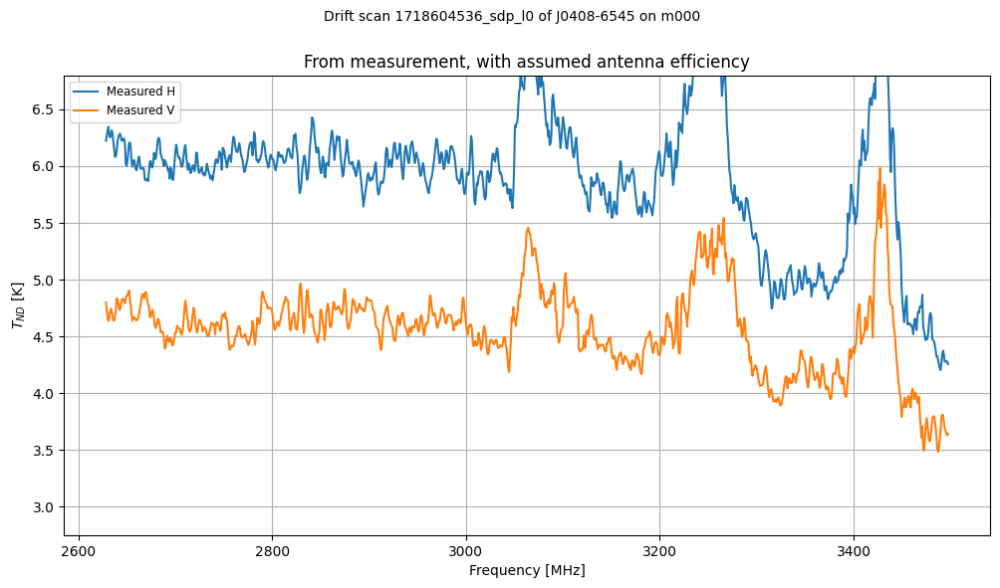

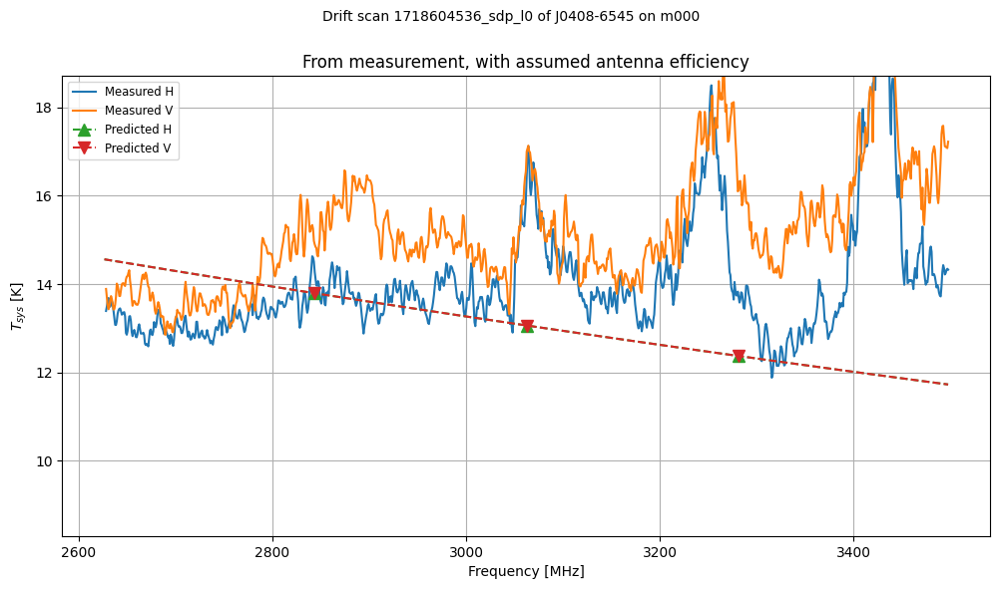

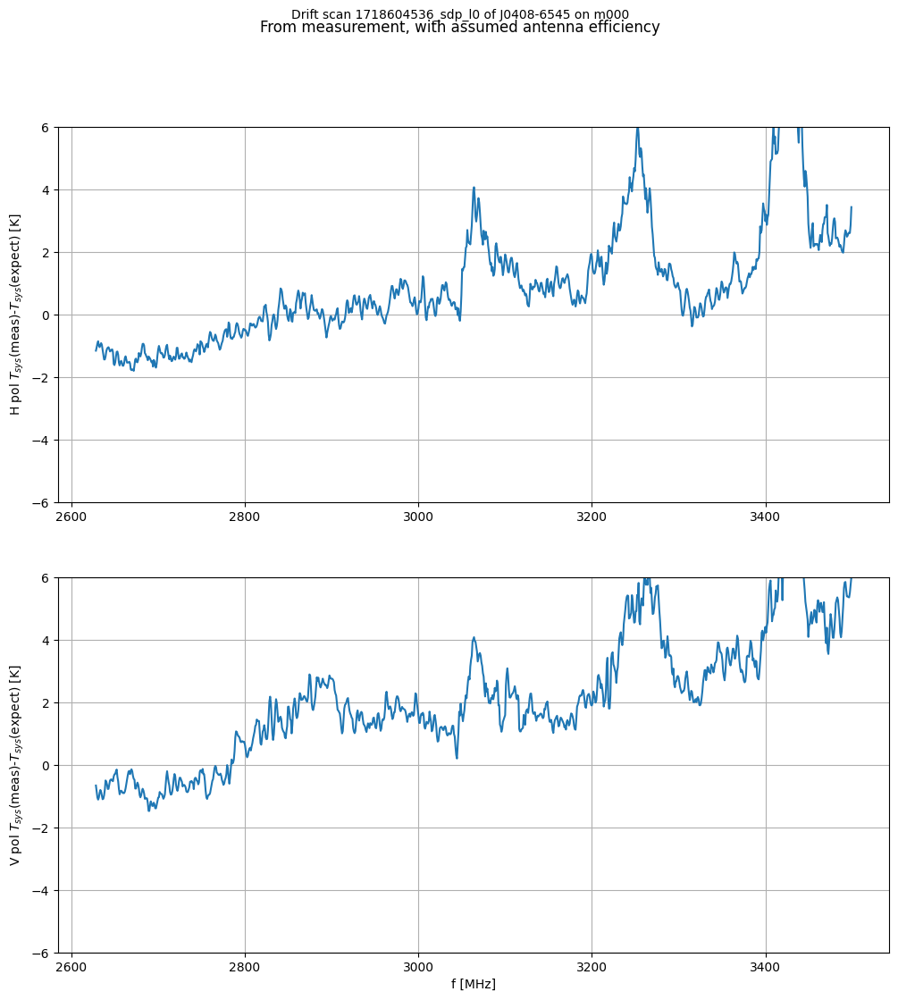

In [7]:
# PKS0408-65, S4 band
ds = driftscan.DriftDataset(cbid2url(1718604536), ant="m000")
results = driftscan.analyse(ds, flux_key=None, debug_nulls=2, saveroot=results_dir, makepdf=True)

# Read the output carefully!
# Note: the "with assumed antenna efficiency" results only make sense if there are model files for ap_eff, T_spillover & LAB noise

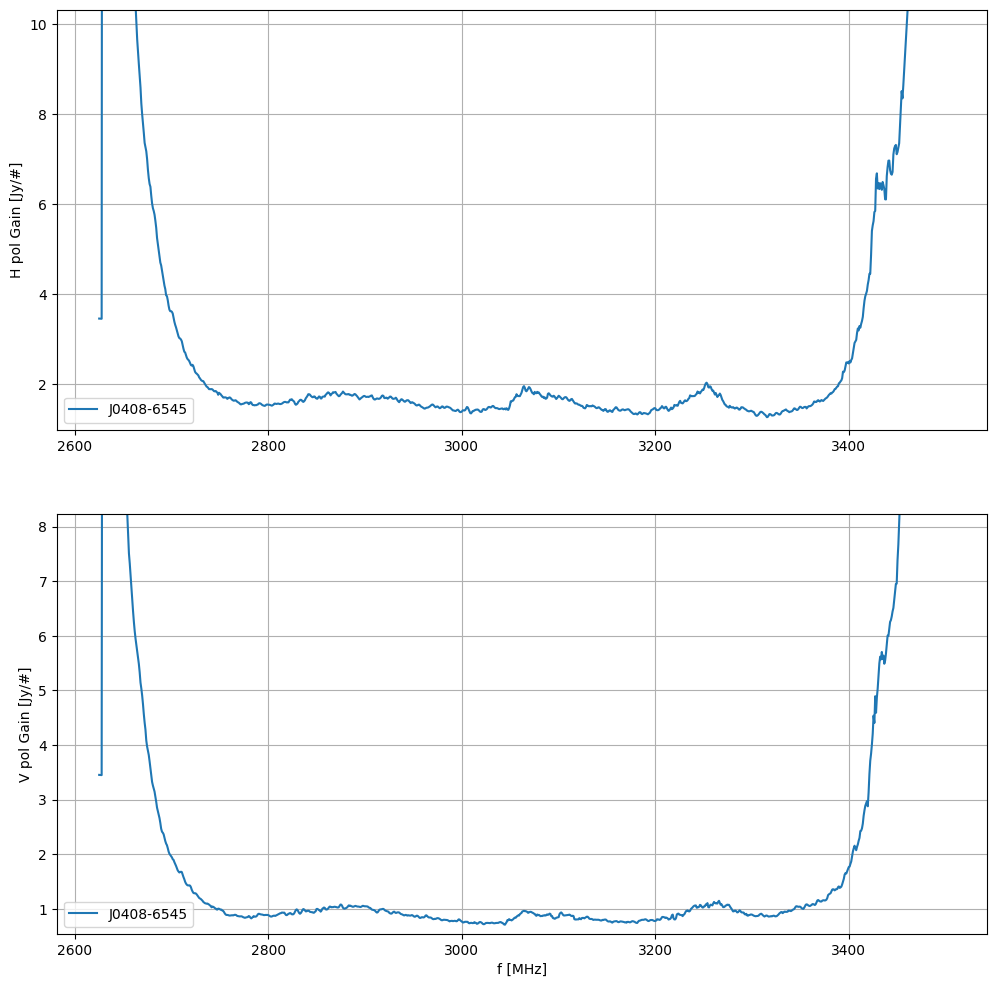

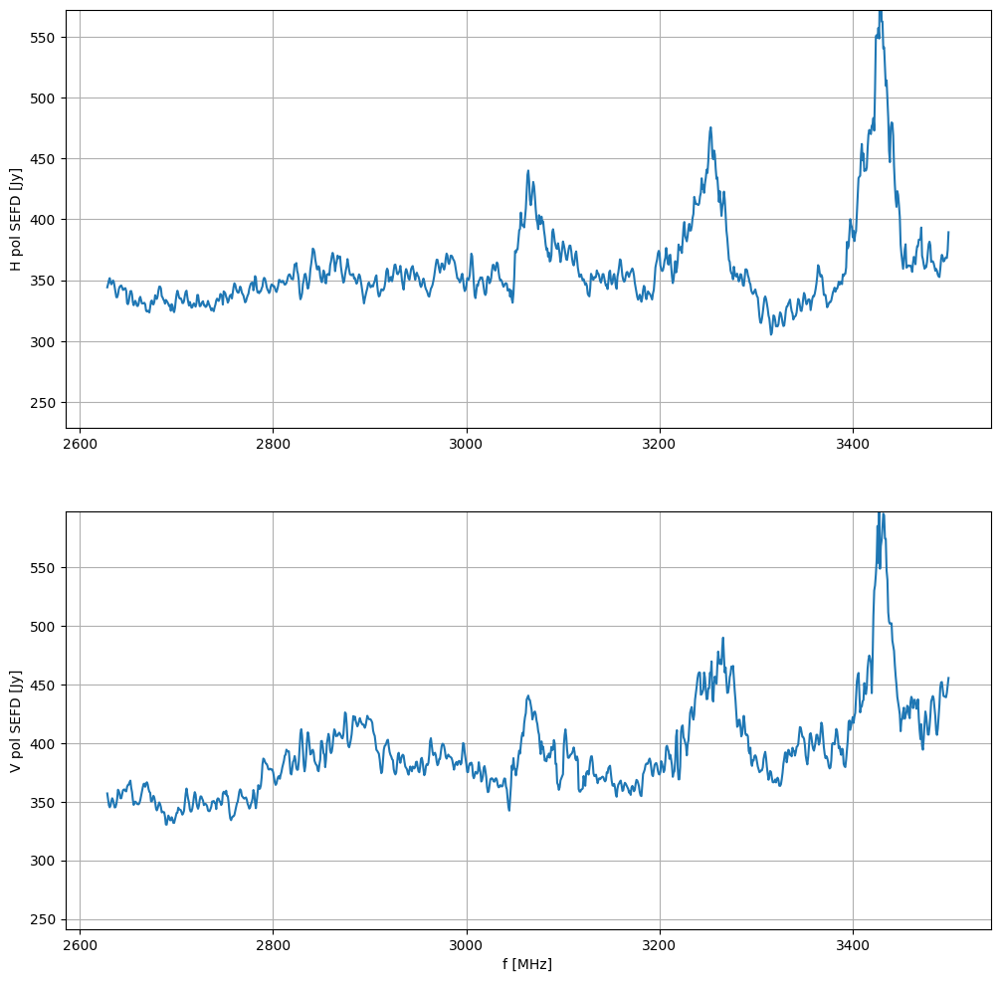

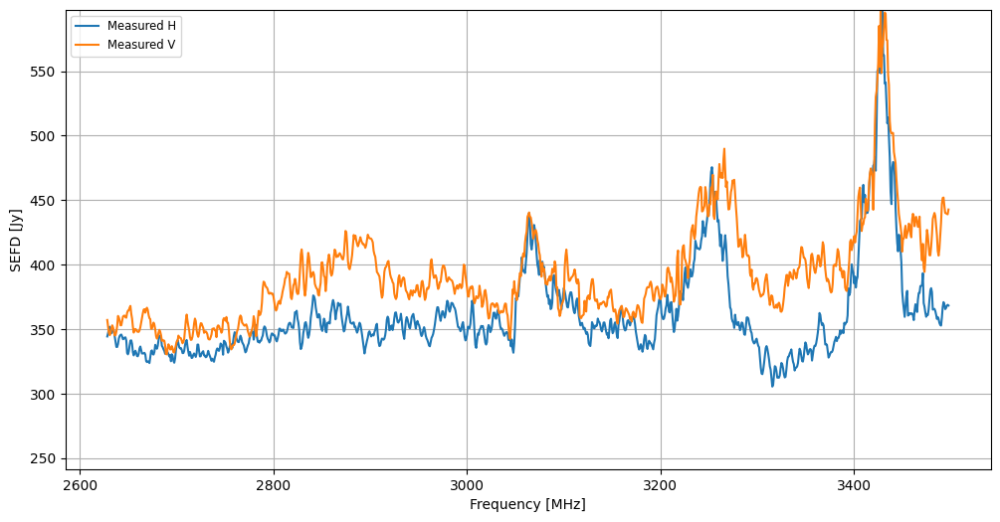

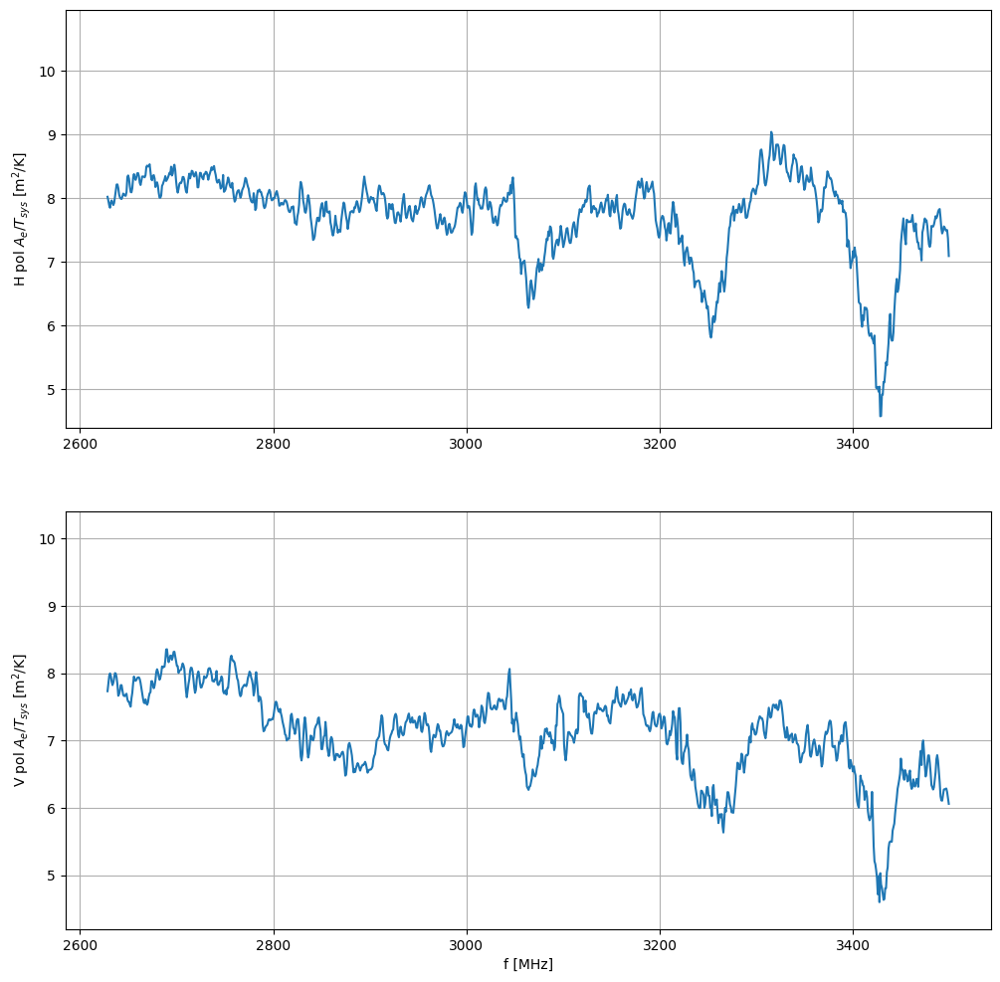

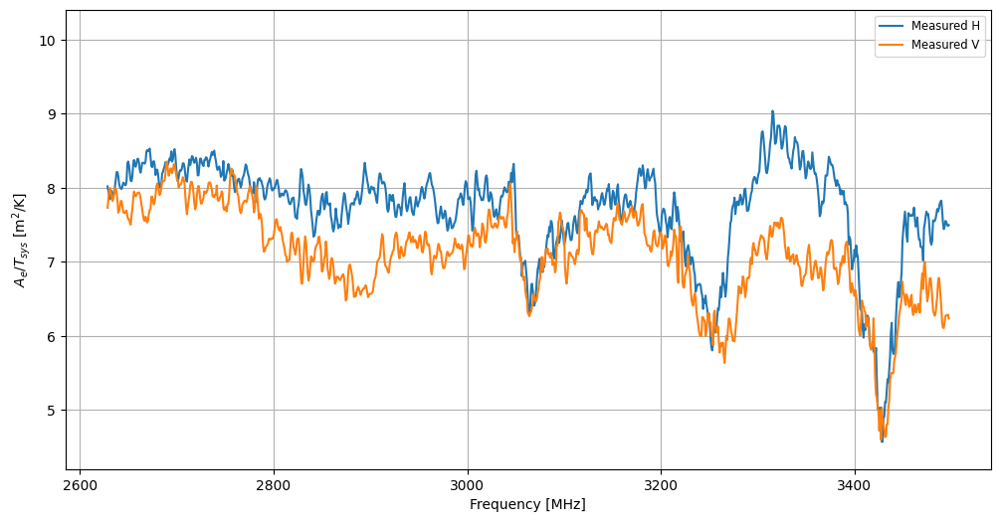

...

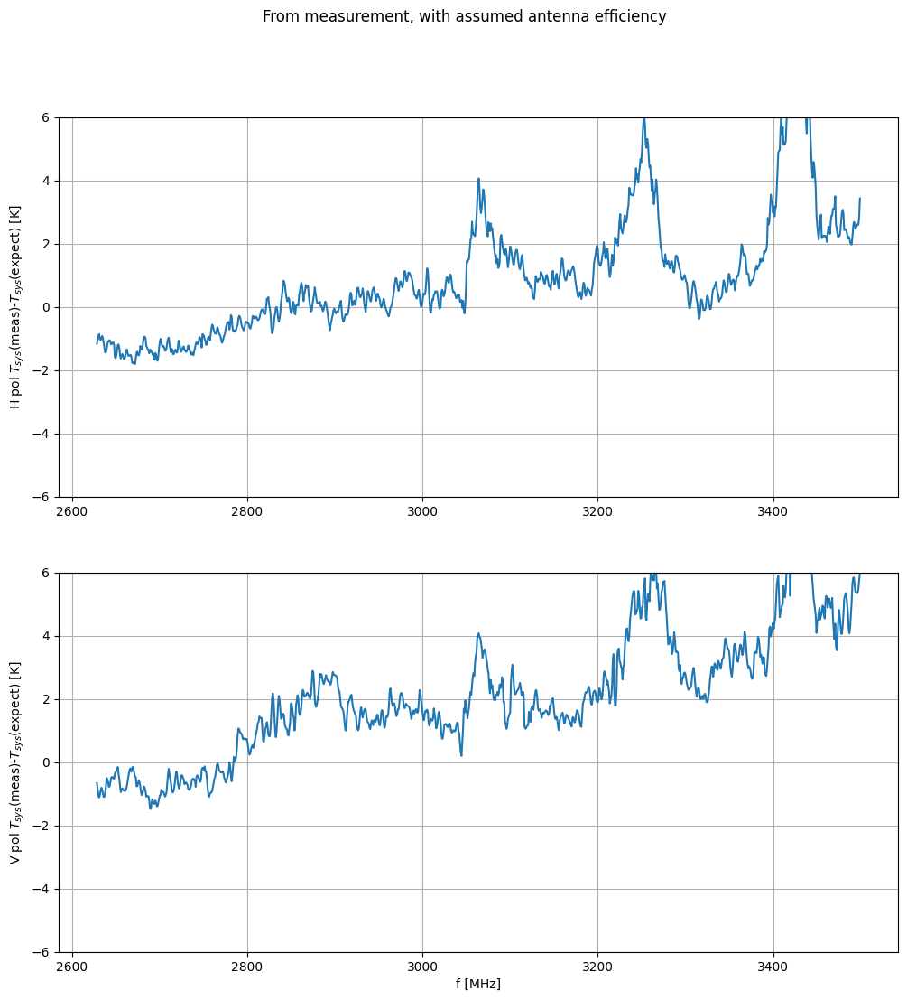

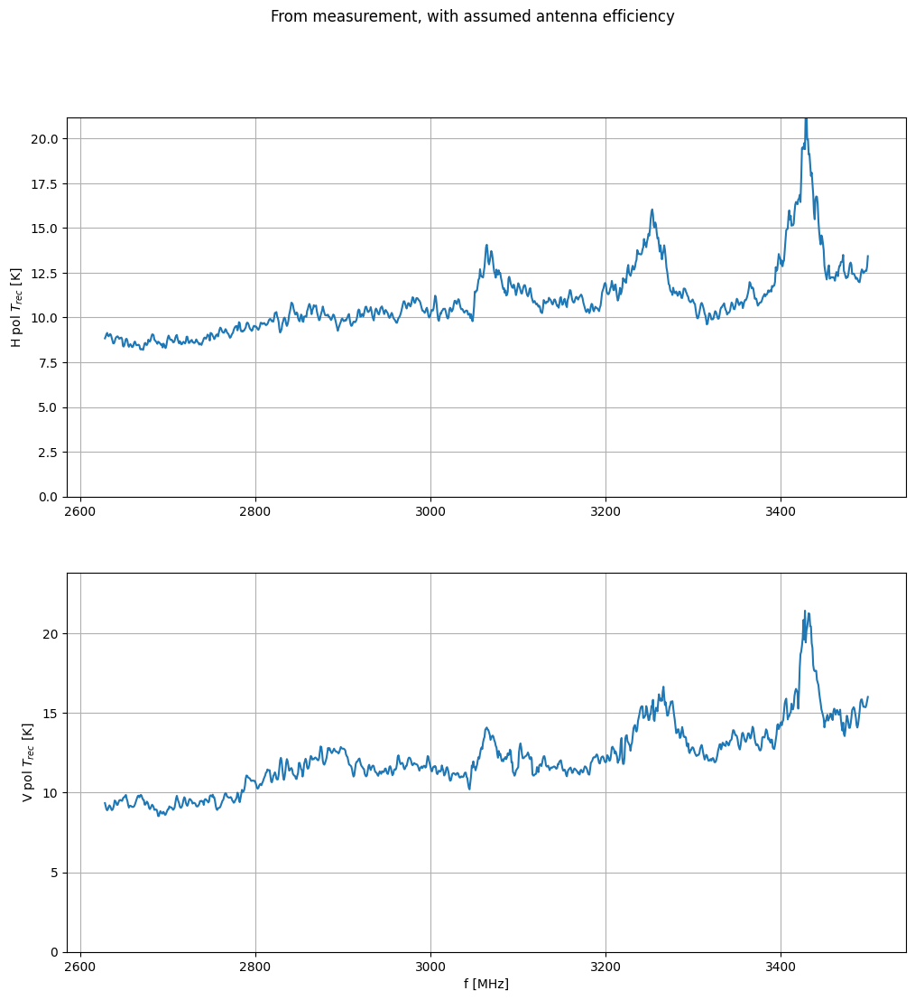

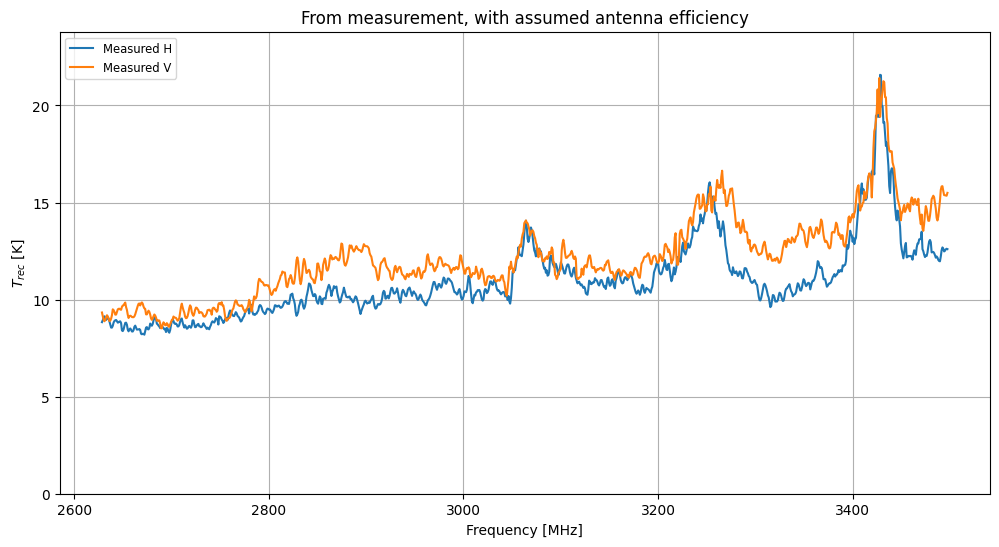

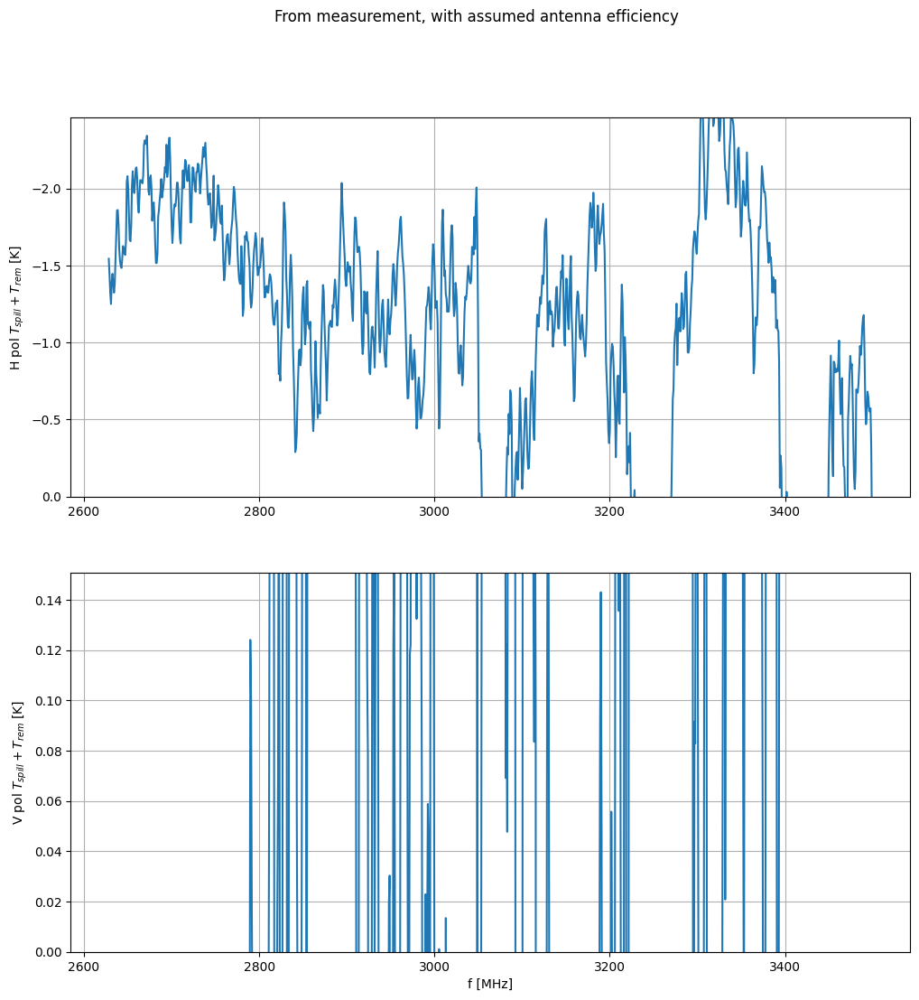

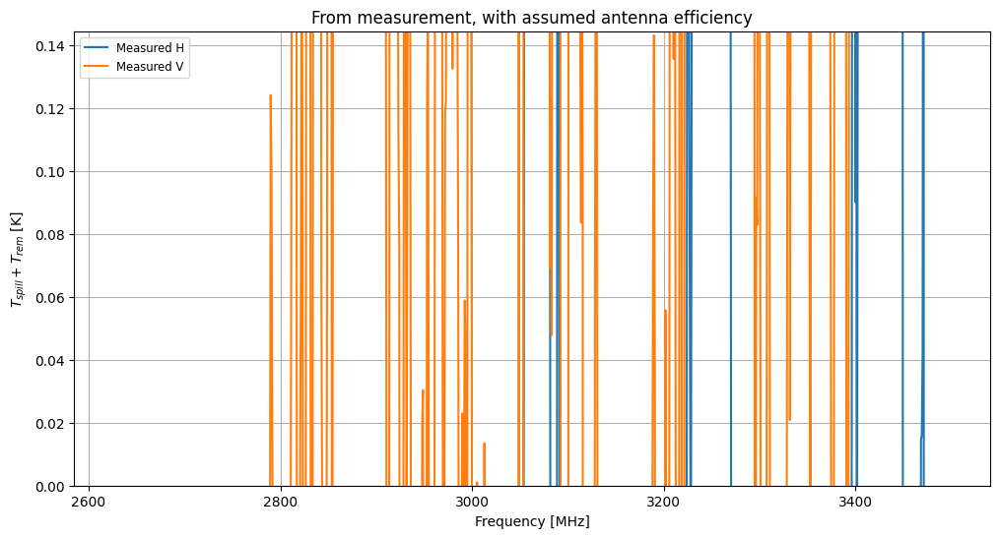

In [8]:
# Combine results onto a common frequency grid. Can also be used if you have results from different datasets, also different frequency bands
freq, m_SEFD, m_TSYS, m_ND, m_TND = driftscan.summarize([results], labels=[ds.target.name])

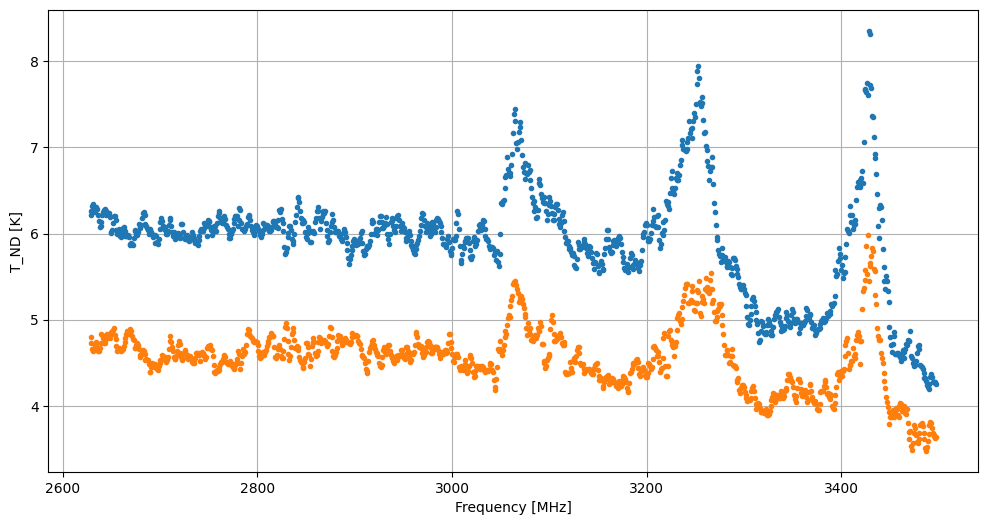

In [9]:
# Generate a Noise Diode template for this antenna - it gets used in other tests.

# Iteratively determine rfi_mask from debug plot below
rfi_mask = [(0,100e6)]
driftscan.save_Tnd(freq, m_TND, ds.RxSN, info="As measured on "+ds.ant.name, rfi_mask=rfi_mask, debug=True,
                   output_dir=modelsroot+'/noise-diode-models')

/tmp/ipykernel_2742980/3566270414.py:12: RuntimeWarning: invalid value encountered in divide
  plt.plot(freq/1e6, SNDHs/(SEFDHs/2.)*100, '-', label="H") # S_ND is defined as 1*per pol, SEFD is defined as 2*per pol
/tmp/ipykernel_2742980/3566270414.py:13: RuntimeWarning: invalid value encountered in divide
  plt.plot(freq/1e6, SNDVs/(SEFDVs/2.)*100, '--', label="V")


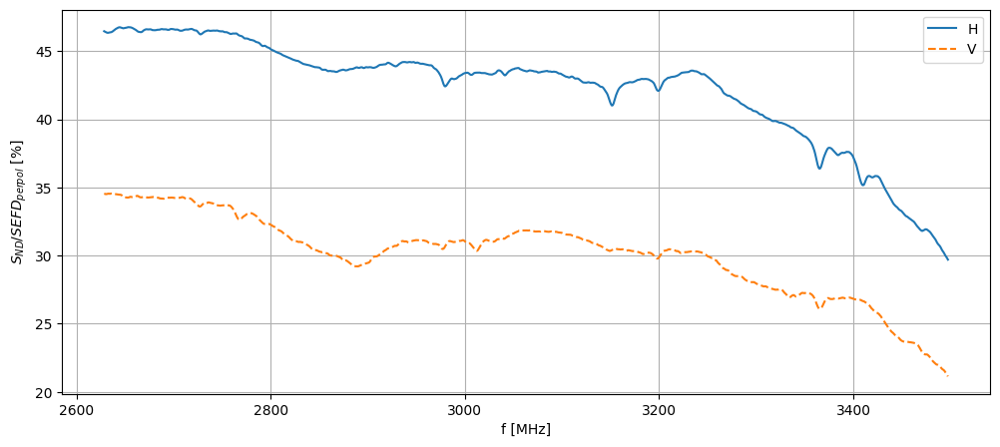

In [10]:
# Load one or more sets of results (this re-grids to a common frequency grid if necessary)
freq, SEFDHs, SEFDVs = driftscan.load_results(["1718604536_sdp_l0-m000"], "SEFD", root=results_dir)
freq, SNDHs, SNDVs = driftscan.load_results(["1718604536_sdp_l0-m000"], "S_ND", root=results_dir)

# Mask out bits if you like
# rfi_mask = [(0,348e6)]
# SEFDHs,SEFDVs = driftscan.mask_where(SEFDHs, freq, rfi_mask), driftscan.mask_where(SEFDVs, freq, rfi_mask)
# SNDHs,SNDVs = driftscan.mask_where(SNDHs, freq, rfi_mask), driftscan.mask_where(SNDVs, freq, rfi_mask)

# e.g. plot the ND ratios as percentage of SEFD
plt.figure(figsize=(12,5))
plt.plot(freq/1e6, SNDHs/(SEFDHs/2.)*100, '-', label="H") # S_ND is defined as 1*per pol, SEFD is defined as 2*per pol
plt.plot(freq/1e6, SNDVs/(SEFDVs/2.)*100, '--', label="V")
plt.xlabel("f [MHz]"); plt.ylabel("$S_{ND}/SEFD_{perpol}$ [%]"); plt.legend()
plt.grid(True)

## Second example - Step by step
The following is approximately what is implemented in `driftscan.analyse(ds, ...)`.

Name: 1719914846_sdp_l0 (version 4.0)
-------------------------------------------------------------------------------
URL: http://10.98.56.16/1719914846/1719914846_sdp_l0.full.rdb
Observer: Mattieu  Experiment ID: 20240702-0004
Description: '2: Drift scan 2'
Observed from 2024-07-02 12:07:33.697 SAST to 2024-07-02 12:49:57.804 SAST
Dump rate / period: 0.49998 Hz / 2.000 s
Subarrays: 1
  ID  Antennas                            Inputs  Corrprods
   0  m000,m001,m002,m003,m004,m005,m006,m007,m008,m009,m010,m011,m012,m013,m014,m015,m016,m017,m018,m019,m020,m021,m022,m023,m025,m026,m028,m029,m030,m031,m032,m033,m034,m035,m036,m037,m038,m039,m040,m041,m042,m043,m045,m046,m048,m049,m050,m051,m052,m053,m054,m055,m056,m057,m058,m060,m061,m062,m063  118      7080
Spectral Windows: 1
  ID Band Product  CentreFreq(MHz)  Bandwidth(MHz)  Channels  ChannelWidth(kHz)
   0 S    c875M1k    3062.500         875.000           1024       854.492
-------------------------------------------------------------

/home/aph/venv-py3/lib/python3.8/site-packages/numpy/lib/nanfunctions.py:1577: RuntimeWarning: All-NaN slice encountered
  result = np.apply_along_axis(_nanquantile_1d, axis, a, q,
/home/aph/work_dvs/dvs/dvs/driftscan.py:272: RuntimeWarning: All-NaN slice encountered
  ax[1][p].plot(chans, 10*np.log10(np.nanmax(self.vis[:,:,p], axis=0)))


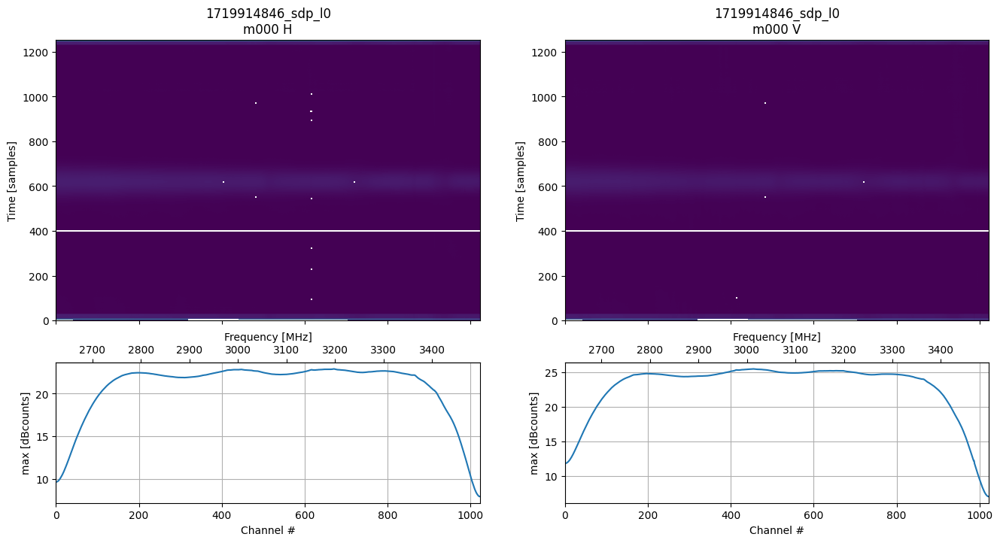

In [11]:
# Pictor A, S4 band
ds = driftscan.DriftDataset(cbid2url(1719914846), ant="m000", debug=True)

Source:	 J0519-4546
INFO: defaulting to the first of the following flux models: Perley & Butler 2017,SARAO
	 Disc-shaped extent 11.0 arcmin; flux model as per [Perley & Butler 2017].
INFO: Fitting transit & beam widths from the data itself.


/home/aph/venv-py3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


INFO: Fitting channel 0 of 67
INFO: Fitting channel 10 of 67
INFO: Fitting channel 20 of 67
INFO: Fitting channel 30 of 67
INFO: Fitting channel 40 of 67
INFO: Fitting channel 50 of 67
INFO: Fitting channel 60 of 67
Fitting HPBW over 2625 - 3499 MHz assuming D=13.50 m
Simultaneous fit to 2 products: 1.24658 lambda^1 / 13.5
Simultaneous fit to 2 products: 1.61137 lambda^(1.11111) / 13.5
Transit found at relative time sample 619; averaging 2 time samples at each datum.


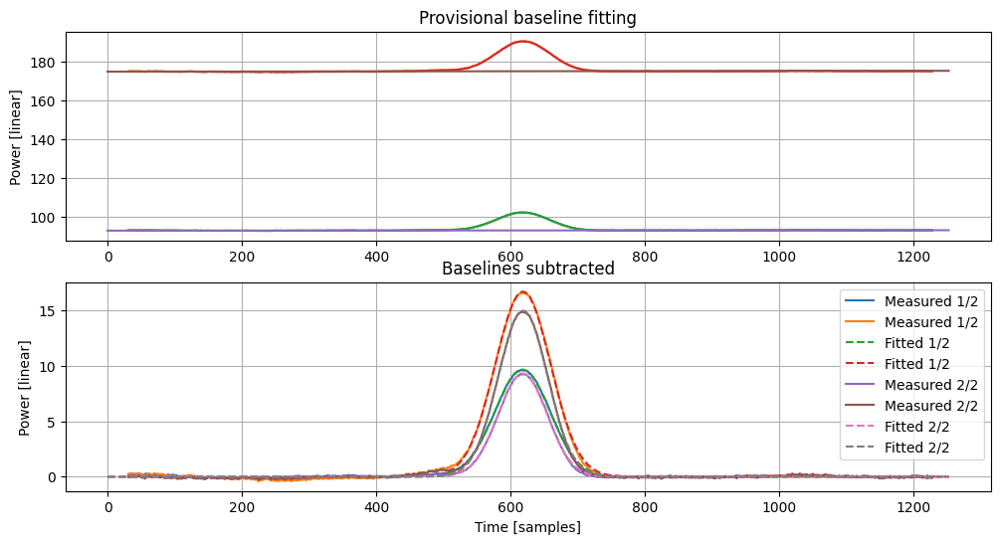

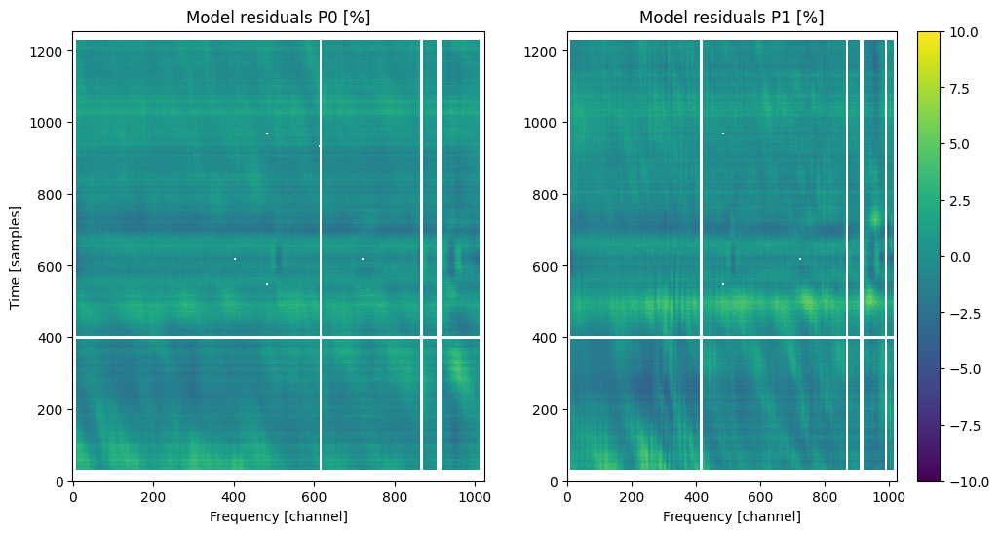

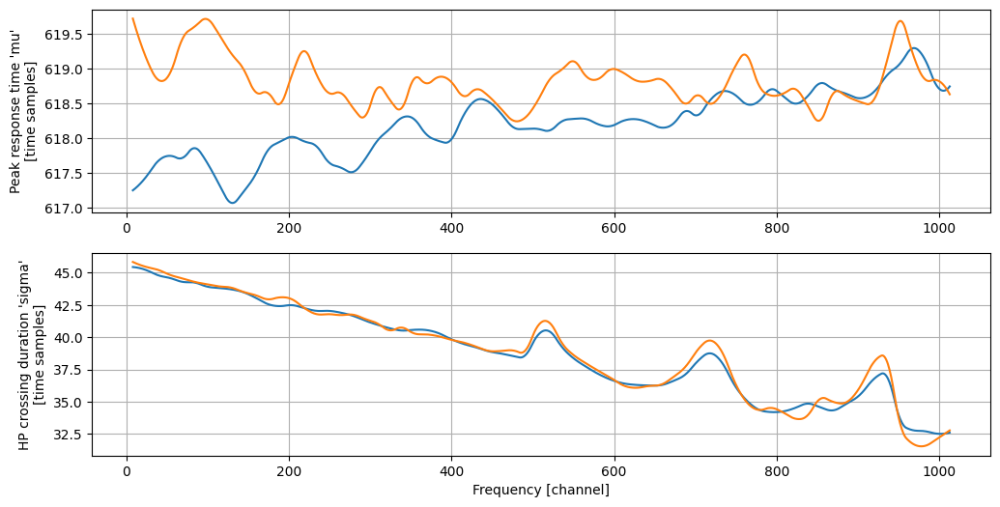

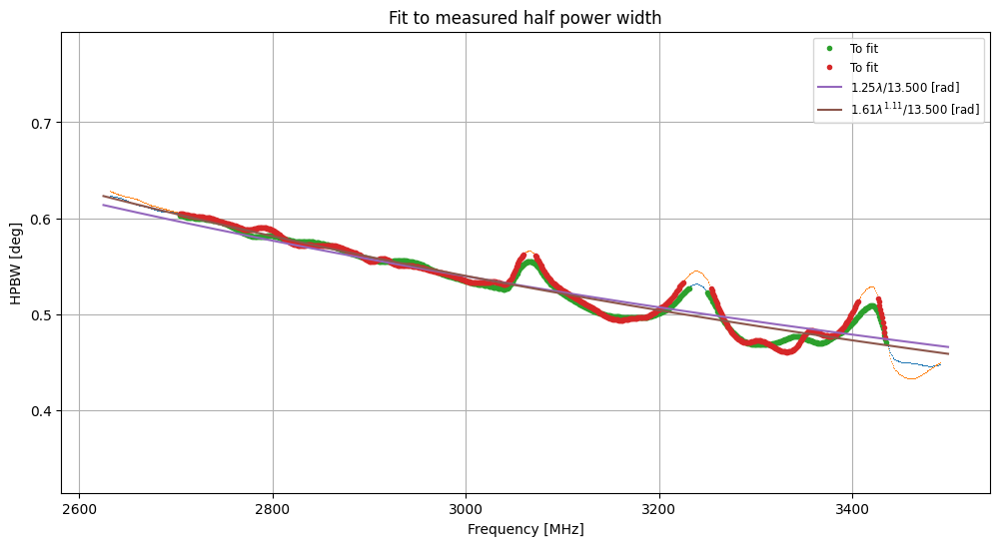

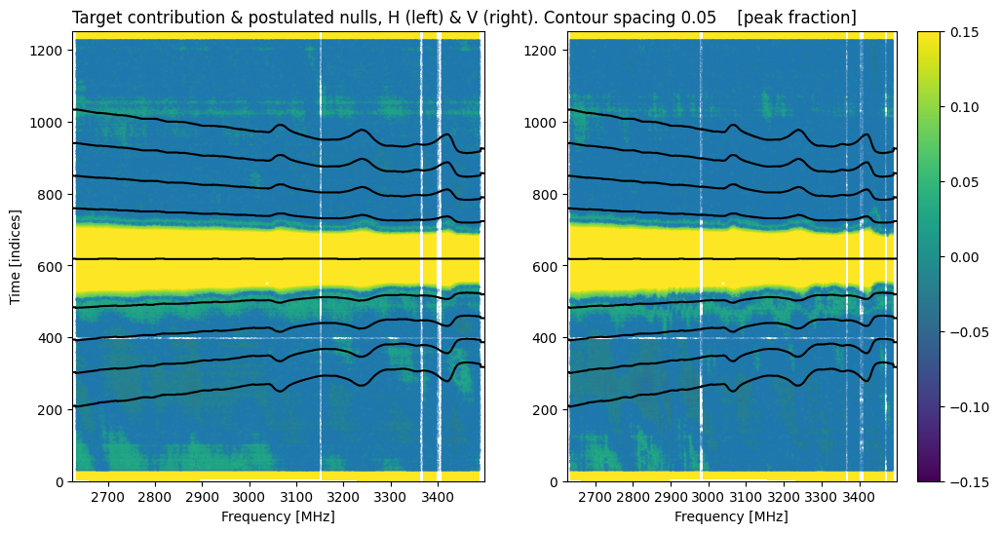

In [12]:
src, hpw_src, profile_src, S_src = driftscan.models.describe_source(ds.target.name, verbose=True)

bore, null_l, null_r, _HPBW, null_w = driftscan.find_nulls(ds, hpw_src=hpw_src, debug_level=1)

In [13]:
_bore_ = int(np.median(bore))

offbore_deg = driftscan.target_offset(ds.target, ds.timestamps[_bore_], ds.az[_bore_], ds.el[_bore_], np.mean(ds.channel_freqs))
hpbw0 = np.nanmedian(_HPBW); hpbwf0 = np.median(ds.channel_freqs[np.abs(_HPBW/hpbw0-1)<0.01])
offbore0 = offbore_deg*np.pi/180/hpbw0
wc_scale = driftscan.models.G_bore(offbore0, hpbwf0, np.max(ds.channel_freqs))
if (wc_scale < 0.99):
    print("CAUTION: source transits far from bore sight, scaling flux by up to %.1f%%"%(100*(1-wc_scale)))

par_angle = ds.parangle[_bore_] * np.pi/180
Sobs_src = lambda f_GHz,yr: S_src(f_GHz,yr,par_angle) * driftscan.models.G_bore(offbore0, hpbwf0/1e9, np.reshape(f_GHz, (-1,1)))

UTC for observation of target: 2024-07-02 10:28:34.750
    Antenna pointing to RA 5.330 hrs, DEC -45.779 deg
    Target Az,El: [219.66873284  68.68953909] deg
    Antenna Az,El: [219.69111538  68.67633144] deg
    Source within [0.02238254 0.01320765] deg of beam bore sight (<0.044 HPBW)
    Distance from target to the Sun 72 deg
    Distance from target to the Moon 74 deg



Deriving measured SEFD
Scaling source flux for beam coupling, atmosphere at elevation 69 deg above horizon, and year 2024.50
Scale factor between 0.9649 and 0.9796
Scaling source flux for beam coupling, atmosphere at elevation 69 deg above horizon, and year 2024.50
Scale factor between 0.9649 and 0.9796
Scaling source flux for beam coupling, atmosphere at elevation 69 deg above horizon, and year 2024.50
Scale factor between 0.9649 and 0.9796
Scaling source flux for beam coupling, atmosphere at elevation 69 deg above horizon, and year 2024.50
Scale factor between 0.9649 and 0.9796

Predicting SEFD at null 0
UTC for specified interval: 2024-07-02 10:22:08.734
    Distance from bore sight to the Sun 72 deg
    Distance from bore sight to the Moon 73 deg
Global Sky Model evaluated at RA 5.221 hrs, DEC -45.784 deg:
    Integrating the map for the beam of a 13.5 m aperture


/home/aph/work_dvs/dvs/dvs/driftscan.py:323: RuntimeWarning: Mean of empty slice
  vis_on = np.nanmean(vis[bore,:,:], axis=0) # Mean over time


    GSM sampled f->T: ['300,48.7', '400,24.4', '600,8.1', '900,2.4', '1300,0.8', '1800,0.3', '2400,0.1', '8000,0.0']

Predicting SEFD at null 1
UTC for specified interval: 2024-07-02 10:24:42.740
    Distance from bore sight to the Sun 72 deg
    Distance from bore sight to the Moon 73 deg
Global Sky Model evaluated at RA 5.264 hrs, DEC -45.783 deg:
    Integrating the map for the beam of a 13.5 m aperture
    GSM sampled f->T: ['300,54.9', '400,30.6', '600,12.5', '900,4.5', '1300,1.6', '1800,0.6', '2400,0.2', '8000,0.0']

Predicting SEFD at null 2
UTC for specified interval: 2024-07-02 10:32:36.760
    Distance from bore sight to the Sun 71 deg
    Distance from bore sight to the Moon 74 deg
Global Sky Model evaluated at RA 5.396 hrs, DEC -45.779 deg:
    Integrating the map for the beam of a 13.5 m aperture
    GSM sampled f->T: ['300,54.8', '400,30.3', '600,12.3', '900,4.4', '1300,1.6', '1800,0.6', '2400,0.2', '8000,0.0']

Predicting SEFD at null 3
UTC for specified interval: 2024-0

/home/aph/work_dvs/dvs/dvs/driftscan.py:466: RuntimeWarning: Mean of empty slice
  S_ND = np.nanmean(S_ND, axis=0) # Average over independent ND measurements -> freq,pol


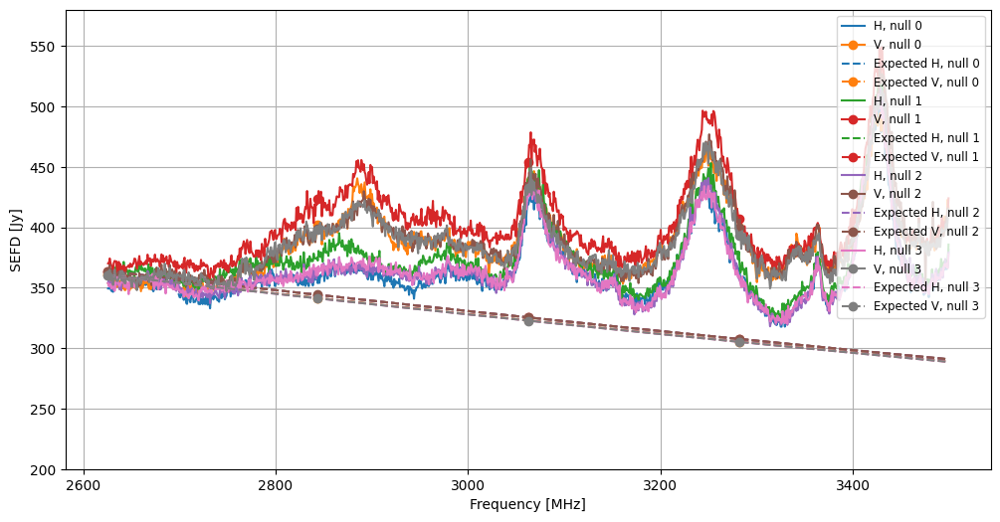

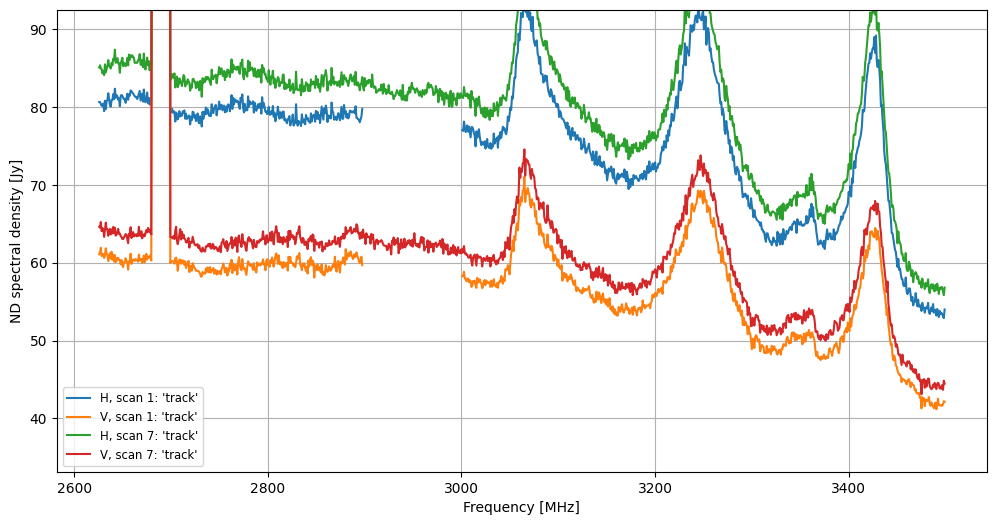

In [14]:
# Use the two nulls on either side of bore sight ("left[0] & right[0]" is the default used by analyse())
freqs, counts2Jy, SEFD_meas, SEFD_pred, Tsys_meas, Trx_deduced, Tspill_deduced, pTsys, pTrx, pTspill, S_ND, T_ND, el_deg = \
        driftscan.get_SEFD_ND(ds, bore,[null_l[1],null_l[0],null_r[0],null_r[1]],null_w,
                              Sobs_src, hpw_src/_HPBW, profile_src,
                              freqmask=[(924e6,960e6),(1084e6,1088e6)]) # Example mask for GSM & SSR - modify as relevant for your dataset

Notes:
1. The "Expected" curves are based on engineering data - which we don't have for S-band.
2. The SEFD results are derived independently at each "null" (but all relative to the same "bore sight"). If these results are significantly different, look carefully at the figures generated by driftscan.find_nulls().
3. The ND results are simply the scaled "ND on-off" measurements (scaled by the counts2Jy). The results show two different measurements, one derived from the "on-off" sequence at the start of the measurement, and the other at the end of the measurement. If these two differ then it's because either beacuse the ND power levels are not stable, or because the analogue gains are not stable. 

## Third Example - Comparing datasets

In [30]:
results = [] # Lists of output from driftscan.analyse()
ants = ["m000", "m010", "m040"] # Pick antennas of interest that appear in both measurements
# In this case, compare two measurements of different targets, with specific flux models
labels = ["0408-65", "0519-45"]
for ant in ants:
    results.append(driftscan.analyse(cbid2url(1719918308), ant=ant, flux_key="PKSCAT90")); plt.close('all')
    results.append(driftscan.analyse(cbid2url(1719914846), ant=ant, flux_key="Perley & Butler 2017")); plt.close('all')

Processing drift scan 1719918308_sdp_l0 on m000 with receiver s.66.

Source:	 J0408-6545
	 Gaussian-shaped extent 0.0 arcmin; flux model as per [PKSCAT90].
INFO: Fitting transit & beam widths from the data itself.


/home/aph/work_dvs/dvs/dvs/driftscan.py:901: RuntimeWarning: Mean of empty slice
  plt.plot(np.arange(vis.shape[0]), np.nanmean(vis[:,fitchans,:], axis=1)); plt.grid(True)
/home/aph/venv-py3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


INFO: Fitting channel 0 of 67
INFO: Fitting channel 10 of 67
INFO: Fitting channel 20 of 67
INFO: Fitting channel 30 of 67
INFO: Fitting channel 40 of 67
INFO: Fitting channel 50 of 67
INFO: Fitting channel 60 of 67
Fitting HPBW over 2625 - 3499 MHz assuming D=13.50 m
Simultaneous fit to 2 products: 1.26566 lambda^1 / 13.5
Simultaneous fit to 2 products: 1.52138 lambda^(1.07959) / 13.5
Transit found at relative time sample 374; averaging 2 time samples at each datum.
UTC for bore sight transit of target: 2024-07-02 11:18:02.374
    Antenna pointing to RA 4.139 hrs, DEC -65.753 deg
    Target Az,El: [205.90463125  43.93459419] deg
    Antenna Az,El: [205.90395062  43.93220003] deg
    Source within [0.00068062 0.00239416] deg of beam bore sight (<0.005 HPBW)
    Distance from target to the Sun 94 deg
    Distance from target to the Moon 90 deg
Scaling source flux for pointing offset, by 1.000 - 1.000 over frequency range

Now determining measured and predicted SEFD with target in beam n

Scaling source flux for beam coupling, atmosphere at elevation 44 deg above horizon, and year 2024.50
Scale factor between 0.9923 and 0.9925
Scaling source flux for beam coupling, atmosphere at elevation 44 deg above horizon, and year 2024.50
Scale factor between 0.9923 and 0.9925

Predicting SEFD at null k0
UTC for specified interval: 2024-07-02 11:11:28.358
    Distance from bore sight to the Sun 94 deg
    Distance from bore sight to the Moon 90 deg
Global Sky Model evaluated at RA 4.029 hrs, DEC -65.757 deg:
    Integrating the map for the beam of a 13.5 m aperture
    GSM sampled f->T: ['300,39.9', '400,20.2', '600,7.6', '900,2.7', '1300,1.0', '1800,0.4', '2400,0.2', '8000,0.0']
    Best fit: T_GSM = 19.1 (f/408)^-2.40

Predicting SEFD at null K0
UTC for specified interval: 2024-07-02 11:24:36.391
    Distance from bore sight to the Sun 93 deg
    Distance from bore sight to the Moon 90 deg
Global Sky Model evaluated at RA 4.249 hrs, DEC -65.751 deg:
    Integrating the map for th

/home/aph/work_dvs/dvs/dvs/driftscan.py:76: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.plot(x_axis,vis,style,**plotargs)


Processing drift scan 1719914846_sdp_l0 on m000 with receiver s.66.

Source:	 J0519-4546
	 Disc-shaped extent 11.0 arcmin; flux model as per [Perley & Butler 2017].
INFO: Fitting transit & beam widths from the data itself.


/home/aph/work_dvs/dvs/dvs/driftscan.py:901: RuntimeWarning: Mean of empty slice
  plt.plot(np.arange(vis.shape[0]), np.nanmean(vis[:,fitchans,:], axis=1)); plt.grid(True)
/home/aph/venv-py3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


INFO: Fitting channel 0 of 67
INFO: Fitting channel 10 of 67
INFO: Fitting channel 20 of 67
INFO: Fitting channel 30 of 67
INFO: Fitting channel 40 of 67
INFO: Fitting channel 50 of 67
INFO: Fitting channel 60 of 67
Fitting HPBW over 2625 - 3499 MHz assuming D=13.50 m
Simultaneous fit to 2 products: 1.24664 lambda^1 / 13.5
Simultaneous fit to 2 products: 1.62831 lambda^(1.11561) / 13.5
Transit found at relative time sample 618; averaging 2 time samples at each datum.
UTC for bore sight transit of target: 2024-07-02 10:28:34.750
    Antenna pointing to RA 5.330 hrs, DEC -45.779 deg
    Target Az,El: [219.66873284  68.68953909] deg
    Antenna Az,El: [219.69111538  68.67633144] deg
    Source within [0.02238254 0.01320765] deg of beam bore sight (<0.044 HPBW)
    Distance from target to the Sun 72 deg
    Distance from target to the Moon 74 deg
Scaling source flux for pointing offset, by 0.996 - 0.994 over frequency range

Now determining measured and predicted SEFD with target in beam n

/home/aph/work_dvs/dvs/dvs/driftscan.py:76: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.plot(x_axis,vis,style,**plotargs)


Processing drift scan 1719918308_sdp_l0 on m010 with receiver s.48.

Source:	 J0408-6545
	 Gaussian-shaped extent 0.0 arcmin; flux model as per [PKSCAT90].
INFO: Fitting transit & beam widths from the data itself.


/home/aph/work_dvs/dvs/dvs/driftscan.py:901: RuntimeWarning: Mean of empty slice
  plt.plot(np.arange(vis.shape[0]), np.nanmean(vis[:,fitchans,:], axis=1)); plt.grid(True)
/home/aph/venv-py3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


INFO: Fitting channel 0 of 67
INFO: Fitting channel 10 of 67
INFO: Fitting channel 20 of 67
INFO: Fitting channel 30 of 67
INFO: Fitting channel 40 of 67
INFO: Fitting channel 50 of 67
INFO: Fitting channel 60 of 67
Fitting HPBW over 2625 - 3499 MHz assuming D=13.50 m
Simultaneous fit to 2 products: 1.23348 lambda^1 / 13.5
Simultaneous fit to 2 products: 2.36796 lambda^(1.28222) / 13.5
Transit found at relative time sample 374; averaging 2 time samples at each datum.
UTC for bore sight transit of target: 2024-07-02 11:18:00.374
    Antenna pointing to RA 4.139 hrs, DEC -65.753 deg
    Target Az,El: [205.90405751  43.93982612] deg
    Antenna Az,El: [205.9046393   43.93177124] deg
    Source within [0.00058179 0.00805488] deg of beam bore sight (<0.016 HPBW)
    Distance from target to the Sun 94 deg
    Distance from target to the Moon 90 deg
Scaling source flux for pointing offset, by 0.999 - 0.999 over frequency range

Now determining measured and predicted SEFD with target in beam n

Scaling source flux for beam coupling, atmosphere at elevation 44 deg above horizon, and year 2024.50
Scale factor between 0.9923 and 0.9925
Scaling source flux for beam coupling, atmosphere at elevation 44 deg above horizon, and year 2024.50
Scale factor between 0.9923 and 0.9925

Predicting SEFD at null k0
UTC for specified interval: 2024-07-02 11:11:38.358
    Distance from bore sight to the Sun 94 deg
    Distance from bore sight to the Moon 90 deg
Global Sky Model evaluated at RA 4.031 hrs, DEC -65.759 deg:
    Integrating the map for the beam of a 13.5 m aperture
    GSM sampled f->T: ['300,39.9', '400,20.2', '600,7.6', '900,2.7', '1300,1.0', '1800,0.4', '2400,0.2', '8000,0.0']
    Best fit: T_GSM = 19.1 (f/408)^-2.40

Predicting SEFD at null K0
UTC for specified interval: 2024-07-02 11:24:30.391
    Distance from bore sight to the Sun 93 deg
    Distance from bore sight to the Moon 90 deg
Global Sky Model evaluated at RA 4.247 hrs, DEC -65.752 deg:
    Integrating the map for th

/home/aph/work_dvs/dvs/dvs/driftscan.py:76: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.plot(x_axis,vis,style,**plotargs)


Processing drift scan 1719914846_sdp_l0 on m010 with receiver s.48.

Source:	 J0519-4546
	 Disc-shaped extent 11.0 arcmin; flux model as per [Perley & Butler 2017].
INFO: Fitting transit & beam widths from the data itself.


/home/aph/work_dvs/dvs/dvs/driftscan.py:901: RuntimeWarning: Mean of empty slice
  plt.plot(np.arange(vis.shape[0]), np.nanmean(vis[:,fitchans,:], axis=1)); plt.grid(True)
/home/aph/venv-py3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


INFO: Fitting channel 0 of 67
INFO: Fitting channel 10 of 67
INFO: Fitting channel 20 of 67
INFO: Fitting channel 30 of 67
INFO: Fitting channel 40 of 67
INFO: Fitting channel 50 of 67
INFO: Fitting channel 60 of 67
Fitting HPBW over 2625 - 3499 MHz assuming D=13.50 m
Simultaneous fit to 2 products: 1.25753 lambda^1 / 13.5
Simultaneous fit to 2 products: 1.51938 lambda^(1.08183) / 13.5
Transit found at relative time sample 621; averaging 2 time samples at each datum.
UTC for bore sight transit of target: 2024-07-02 10:28:38.750
    Antenna pointing to RA 5.330 hrs, DEC -45.779 deg
    Target Az,El: [219.69422311  68.68192343] deg
    Antenna Az,El: [219.6917098   68.67595396] deg
    Source within [0.00251331 0.00596947] deg of beam bore sight (<0.012 HPBW)
    Distance from target to the Sun 72 deg
    Distance from target to the Moon 74 deg
Scaling source flux for pointing offset, by 1.000 - 1.000 over frequency range

Now determining measured and predicted SEFD with target in beam n

/home/aph/work_dvs/dvs/dvs/driftscan.py:76: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.plot(x_axis,vis,style,**plotargs)


Processing drift scan 1719918308_sdp_l0 on m040 with receiver s.69.

Source:	 J0408-6545
	 Gaussian-shaped extent 0.0 arcmin; flux model as per [PKSCAT90].
INFO: Fitting transit & beam widths from the data itself.


/home/aph/work_dvs/dvs/dvs/driftscan.py:901: RuntimeWarning: Mean of empty slice
  plt.plot(np.arange(vis.shape[0]), np.nanmean(vis[:,fitchans,:], axis=1)); plt.grid(True)
/home/aph/venv-py3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


INFO: Fitting channel 0 of 67
INFO: Fitting channel 10 of 67
INFO: Fitting channel 20 of 67
INFO: Fitting channel 30 of 67
INFO: Fitting channel 40 of 67
INFO: Fitting channel 50 of 67
INFO: Fitting channel 60 of 67
Fitting HPBW over 2625 - 3499 MHz assuming D=13.50 m
Simultaneous fit to 2 products: 1.29914 lambda^1 / 13.5
Simultaneous fit to 2 products: 1.53994 lambda^(1.07369) / 13.5
Transit found at relative time sample 376; averaging 2 time samples at each datum.
UTC for bore sight transit of target: 2024-07-02 11:18:06.375
    Antenna pointing to RA 4.139 hrs, DEC -65.753 deg
    Target Az,El: [205.91042325  43.93248708] deg
    Antenna Az,El: [205.90454841  43.93184092] deg
    Source within [0.00587483 0.00064616] deg of beam bore sight (<0.012 HPBW)
    Distance from target to the Sun 94 deg
    Distance from target to the Moon 90 deg
Scaling source flux for pointing offset, by 1.000 - 1.000 over frequency range

Now determining measured and predicted SEFD with target in beam n

Scaling source flux for beam coupling, atmosphere at elevation 44 deg above horizon, and year 2024.50
Scale factor between 0.9923 and 0.9925
Scaling source flux for beam coupling, atmosphere at elevation 44 deg above horizon, and year 2024.50
Scale factor between 0.9923 and 0.9925

Predicting SEFD at null k0
UTC for specified interval: 2024-07-02 11:11:16.357
    Distance from bore sight to the Sun 94 deg
    Distance from bore sight to the Moon 90 deg
Global Sky Model evaluated at RA 4.025 hrs, DEC -65.760 deg:
    Integrating the map for the beam of a 13.5 m aperture
    GSM sampled f->T: ['300,39.5', '400,19.8', '600,7.2', '900,2.4', '1300,0.9', '1800,0.3', '2400,0.1', '8000,0.0']
    Best fit: T_GSM = 18.6 (f/408)^-2.46

Predicting SEFD at null K0
UTC for specified interval: 2024-07-02 11:24:54.392
    Distance from bore sight to the Sun 93 deg
    Distance from bore sight to the Moon 90 deg
Global Sky Model evaluated at RA 4.253 hrs, DEC -65.753 deg:
    Integrating the map for th

/home/aph/work_dvs/dvs/dvs/driftscan.py:76: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.plot(x_axis,vis,style,**plotargs)


Processing drift scan 1719914846_sdp_l0 on m040 with receiver s.69.

Source:	 J0519-4546
	 Disc-shaped extent 11.0 arcmin; flux model as per [Perley & Butler 2017].
INFO: Fitting transit & beam widths from the data itself.


/home/aph/work_dvs/dvs/dvs/driftscan.py:901: RuntimeWarning: Mean of empty slice
  plt.plot(np.arange(vis.shape[0]), np.nanmean(vis[:,fitchans,:], axis=1)); plt.grid(True)
/home/aph/venv-py3/lib/python3.8/site-packages/numpy/core/fromnumeric.py:784: UserWarning: Warning: 'partition' will ignore the 'mask' of the MaskedArray.
  a.partition(kth, axis=axis, kind=kind, order=order)


INFO: Fitting channel 0 of 67
INFO: Fitting channel 10 of 67
INFO: Fitting channel 20 of 67
INFO: Fitting channel 30 of 67
INFO: Fitting channel 40 of 67
INFO: Fitting channel 50 of 67
INFO: Fitting channel 60 of 67
Fitting HPBW over 2625 - 3499 MHz assuming D=13.50 m
Simultaneous fit to 2 products: 1.25669 lambda^1 / 13.5
Simultaneous fit to 2 products: 1.4655 lambda^(1.06652) / 13.5
Transit found at relative time sample 620; averaging 2 time samples at each datum.
UTC for bore sight transit of target: 2024-07-02 10:28:36.750
    Antenna pointing to RA 5.330 hrs, DEC -45.779 deg
    Target Az,El: [219.68586295  68.68856237] deg
    Antenna Az,El: [219.6917815   68.67612411] deg
    Source within [0.00591855 0.01243826] deg of beam bore sight (<0.025 HPBW)
    Distance from target to the Sun 72 deg
    Distance from target to the Moon 74 deg
Scaling source flux for pointing offset, by 0.999 - 0.998 over frequency range

Now determining measured and predicted SEFD with target in beam nu

/home/aph/work_dvs/dvs/dvs/driftscan.py:76: UserWarning: linestyle is redundantly defined by the 'linestyle' keyword argument and the fmt string "-" (-> linestyle='-'). The keyword argument will take precedence.
  plt.plot(x_axis,vis,style,**plotargs)


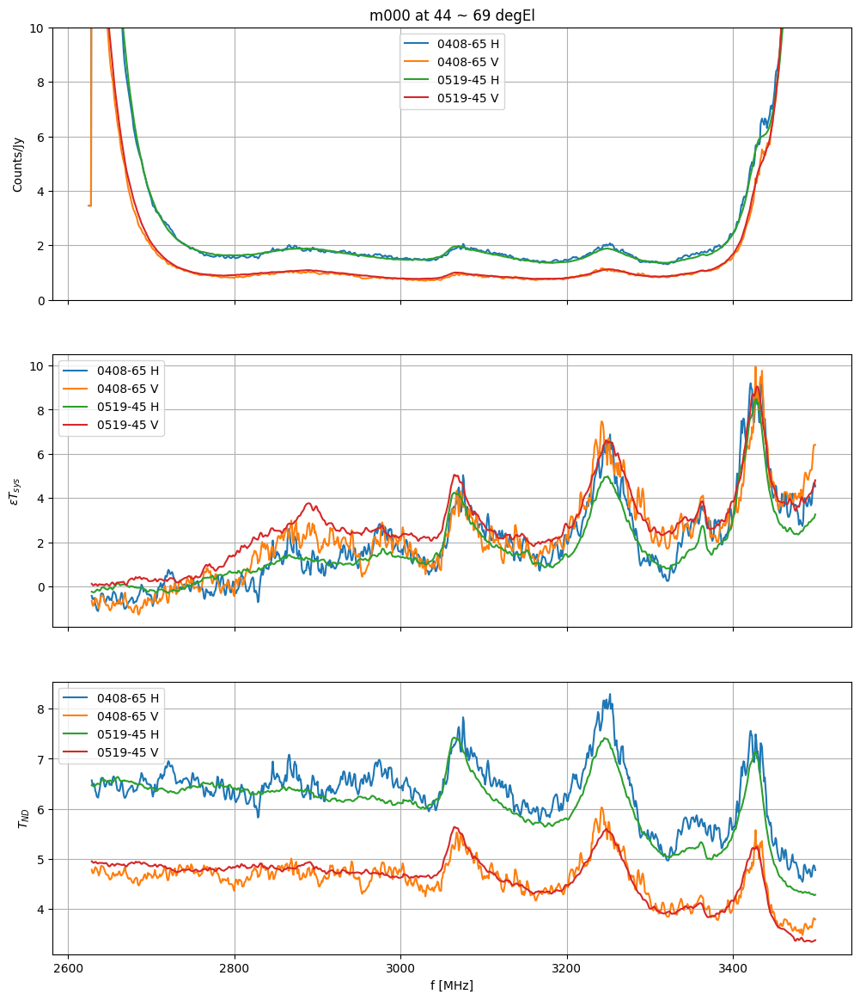

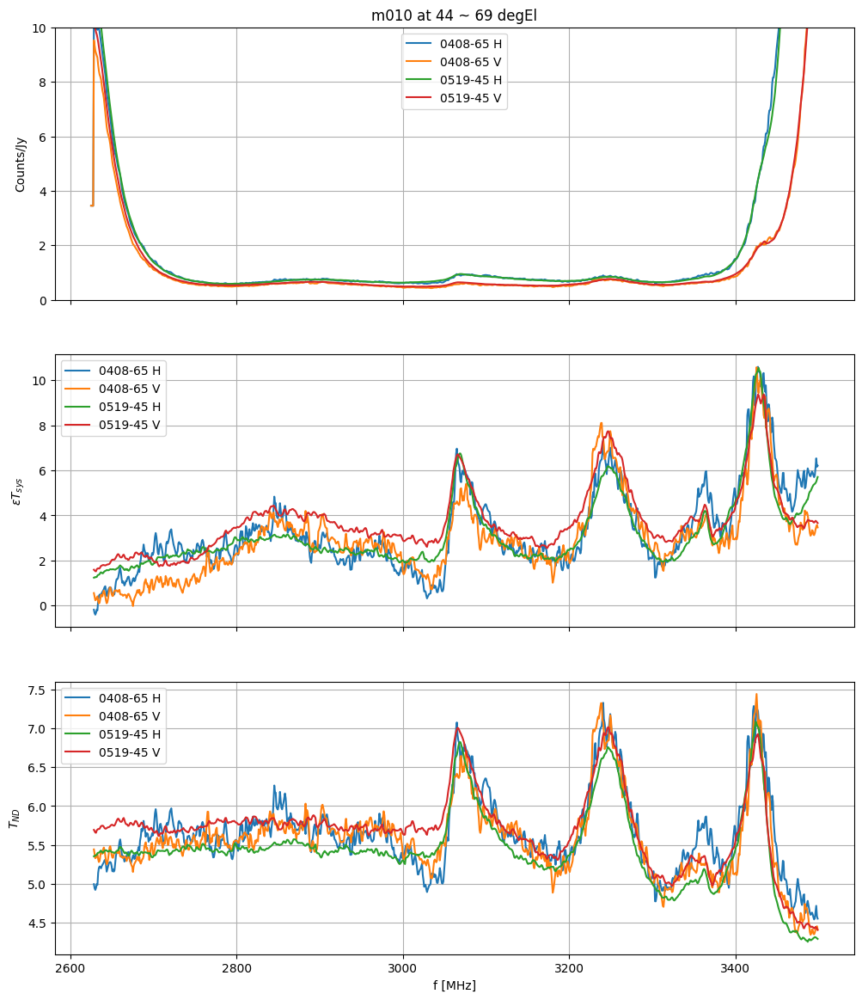

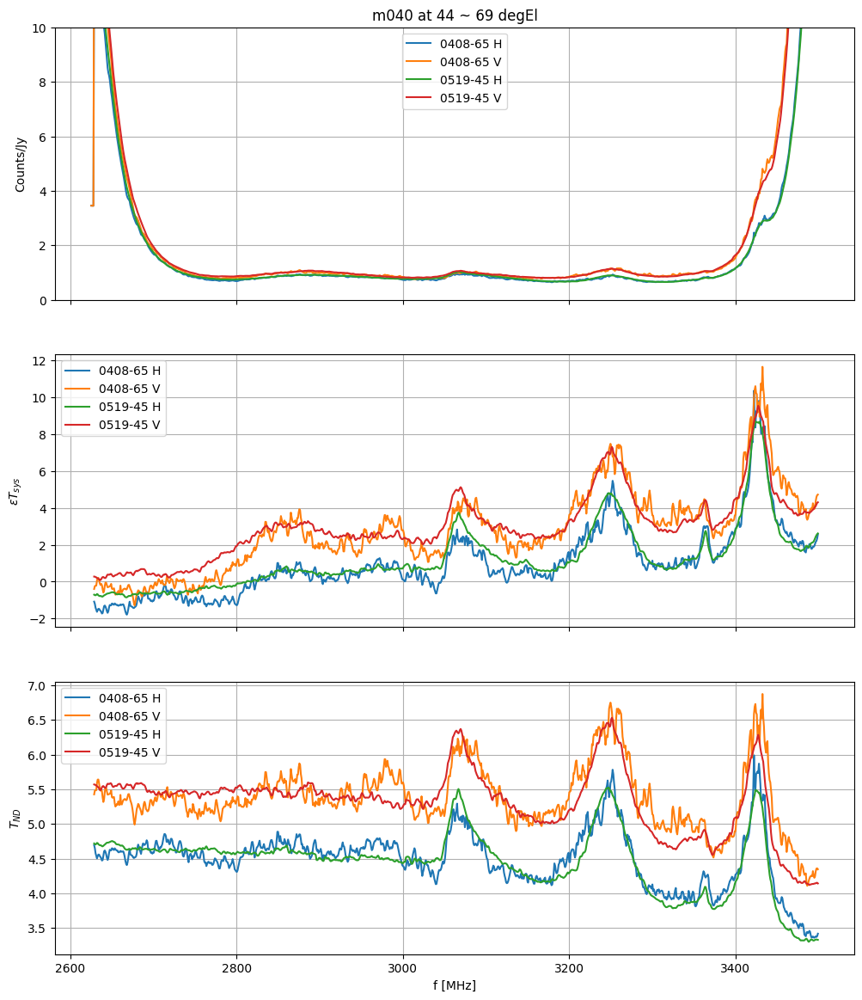

In [31]:
labels = ["0408-65", "0519-45"]
# Compare the results per antenna
for i, ant in enumerate(ants):
    freqs, counts2Jy, SEFD_meas, pSEFD, Tsys_meas, Trx_deduced, Tspill_deduced, pTsys, pTrx, pTspill, S_ND, T_ND, el_deg, offbore_deg = results[i*len(labels)]
    f, c2J, _, _, Ts, _, _, pTs, _, _, _, TN, el, off = results[i*len(labels)+1]
    fig, axs = plt.subplots(3,1, sharex=True, figsize=(12,14))
    axs[0].plot(freqs/1e6, counts2Jy, f/1e6, c2J); axs[0].set_ylim(0,10); axs[0].set_ylabel("Counts/Jy")
    axs[1].plot(freqs/1e6, Tsys_meas-pTsys, f/1e6, Ts-pTs); axs[1].set_ylabel(r"$\epsilon T_{sys}$")
    axs[2].plot(freqs/1e6, T_ND, f/1e6, TN); axs[2].set_ylabel("$T_{ND}$")
    for ax in axs: ax.grid(True); ax.legend([labels[0]+" H",labels[0]+" V",labels[1]+" H",labels[1]+" V"])
    axs[2].set_xlabel("f [MHz]")
    axs[0].set_title(f"{ant} at {el_deg:.0f} ~ {el:.0f} degEl")

m000 std(counts2Jy)/sqrt2 0.19340110944300692 0.1080386793817165
m010 std(counts2Jy)/sqrt2 0.3238051467391602 0.06334275579663427
m040 std(counts2Jy)/sqrt2 0.0630595594018988 0.12192497160723216


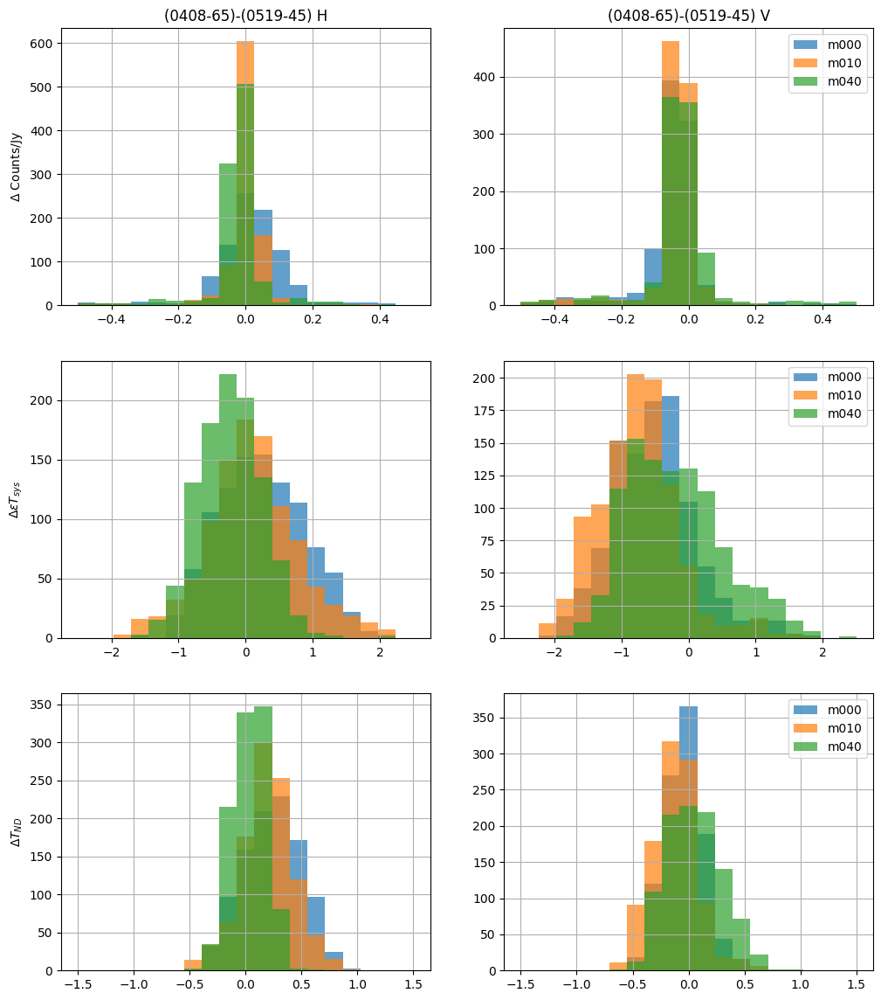

In [32]:
# Make histograms of the differences
fig, axs = plt.subplots(3,2, figsize=(12,14))
for i, ant in enumerate(ants):
    freqs, counts2Jy, SEFD_meas, pSEFD, Tsys_meas, Trx_deduced, Tspill_deduced, pTsys, pTrx, pTspill, S_ND, T_ND, el_deg, offbore_deg = results[i*len(labels)]
    f, c2J, _, _, Ts, _, _, pTs, _, _, _, TN, el, off = results[i*len(labels)+1]
    print(ant, "std(counts2Jy)/sqrt2", np.std((counts2Jy - c2J)[20:-20,0])/2**.5, np.std((counts2Jy - c2J)[20:-20,1])/2**.5) # Ignore the edge channels - low SNR
    for p in [0,1]:
        axs[0][p].hist((counts2Jy - c2J)[:,p], bins=np.linspace(-.5,.5,20), label=ant, alpha=0.7)
        axs[1][p].hist((Tsys_meas-pTsys - (Ts-pTs))[:,p], bins=np.linspace(-2.5,2.5,20), label=ant, alpha=0.7)
        axs[2][p].hist((T_ND - TN)[:,p], bins=np.linspace(-1.5,1.5,20), label=ant, alpha=0.7)
for p in [0,1]:
    axs[0][p].set_title([f"({labels[0]})-({labels[1]}) H",f"({labels[0]})-({labels[1]}) V"][p])
    for i in range(3): axs[i][p].grid(True)
axs[0][0].set_ylabel("$\Delta$ Counts/Jy"); axs[0][1].legend()
axs[1][0].set_ylabel(r"$\Delta \epsilon T_{sys}$"); axs[1][1].legend()
axs[2][0].set_ylabel("$\Delta T_{ND}$"); axs[2][1].legend()